# Data import

In [7]:
import pandas as pd
df = pd.read_excel("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/GSE280311_README_Flex.xlsx")
df.to_csv("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/GSE280311_README_Flex.csv",
          index=False, encoding="utf-8-sig")

print("✅ CSV 변환 완료!")


✅ CSV 변환 완료!


In [11]:
import scanpy as sc
import pandas as pd
from pathlib import Path

meta_df = pd.read_csv("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/GSE280311_README_Flex.csv")
data_dir = Path("/home/Data_Drive_8TB/kykim/2. CRC/CRC2")
h5_files = sorted(data_dir.glob("*_count_filtered_feature_bc_matrix.h5"))  # 정렬해 순서 고정

adatas = []
for idx, h5_file in enumerate(h5_files, start=1):
    ad = sc.read_10x_h5(str(h5_file))
    ad.var_names_make_unique()
    sample_prefix = f"{idx:02d}"
    ad.obs_names = [f"{sample_prefix}_{barcode}" for barcode in ad.obs_names]

    file_name = h5_file.name
    row = meta_df[meta_df['filename'] == file_name]
    if len(row) == 1:
        for col in ['TissueType', 'SampleID', 'Location', 'Stage', 'Gender', 'Age']:
            ad.obs[col] = row[col].values[0]

    adatas.append(ad)

merged_adata = adatas[0].concatenate(
    adatas[1:],
    join='inner',
    index_unique=None
)

print(merged_adata)
print(merged_adata.obs.head())


/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/Data_Drive_8TB/kykim/.local/lib/python3.10/site-packages/anndata/_core/anndata.py:1758

AnnData object with n_obs × n_vars = 279609 × 18082
    obs: 'TissueType', 'SampleID', 'Location', 'Stage', 'Gender', 'Age', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'
                                 TissueType SampleID Location  Stage Gender  \
01_AAACAAGCAACAGCACACTTTAGG-1  Colon Cancer    P2CRC  Sigmoid  III-B      M   
01_AAACAAGCAACAGCTAACTTTAGG-1  Colon Cancer    P2CRC  Sigmoid  III-B      M   
01_AAACAAGCAACTGTTCACTTTAGG-1  Colon Cancer    P2CRC  Sigmoid  III-B      M   
01_AAACAAGCAAGGCCTGACTTTAGG-1  Colon Cancer    P2CRC  Sigmoid  III-B      M   
01_AAACAAGCACATAGTGACTTTAGG-1  Colon Cancer    P2CRC  Sigmoid  III-B      M   

                               Age batch  
01_AAACAAGCAACAGCACACTTTAGG-1   60     0  
01_AAACAAGCAACAGCTAACTTTAGG-1   60     0  
01_AAACAAGCAACTGTTCACTTTAGG-1   60     0  
01_AAACAAGCAAGGCCTGACTTTAGG-1   60     0  
01_AAACAAGCACATAGTGACTTTAGG-1   60     0  


In [14]:
merged_adata.write("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/merged_adata.h5ad")

In [14]:
sc.settings.set_figure_params(dpi=80, facecolor="white")

# Basic analysis

In [1]:
import scanpy as sc
h5ad_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/merged_adata.h5ad"

adata = sc.read_h5ad(h5ad_path)

In [7]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

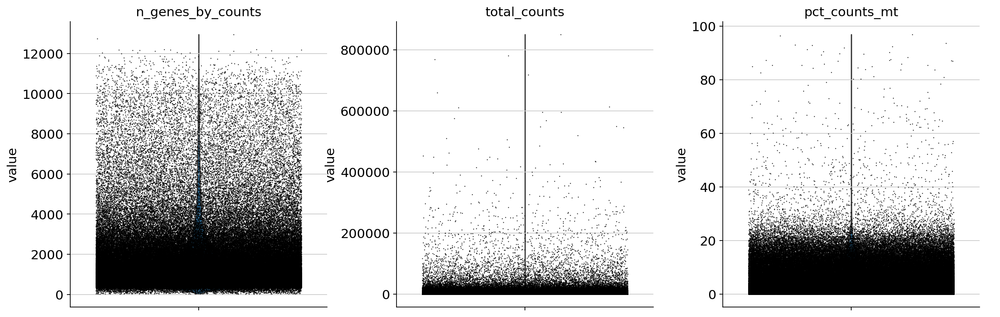

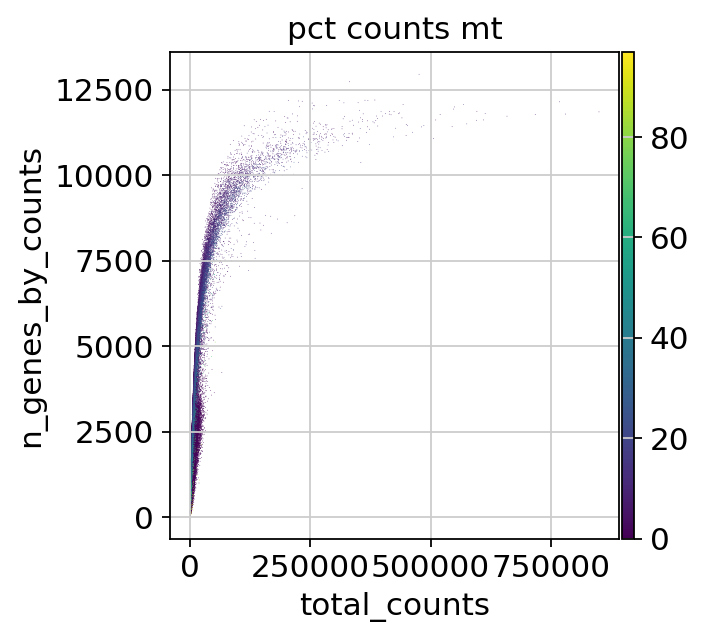

In [15]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

Before QC: (279609, 18082)


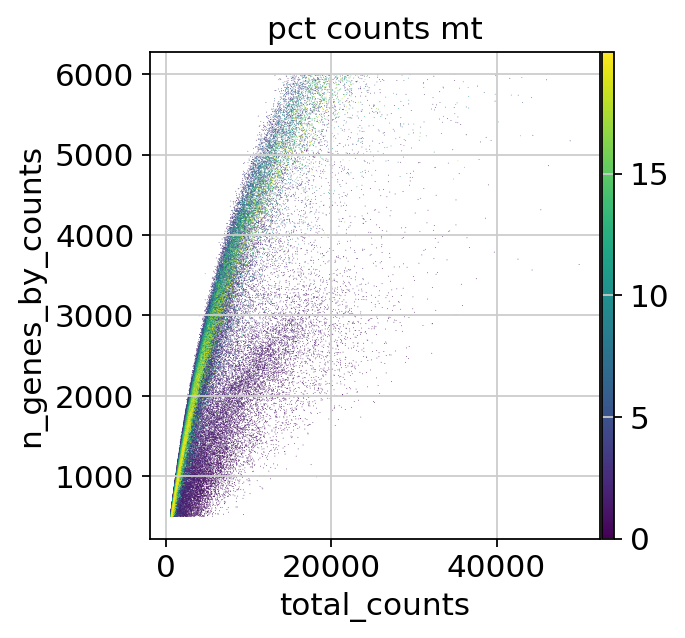

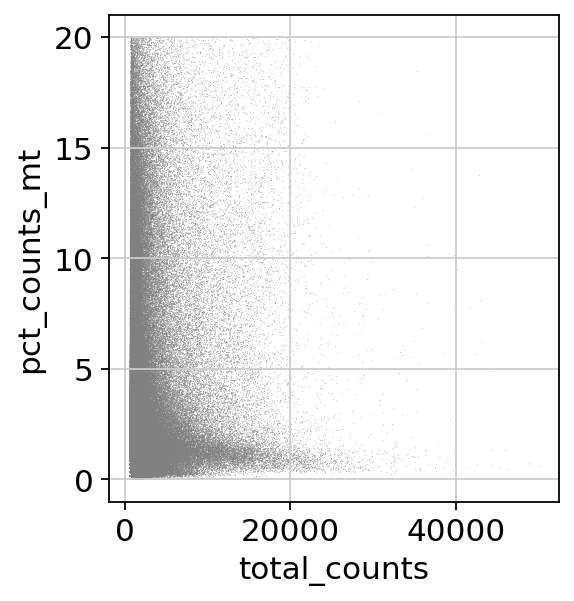

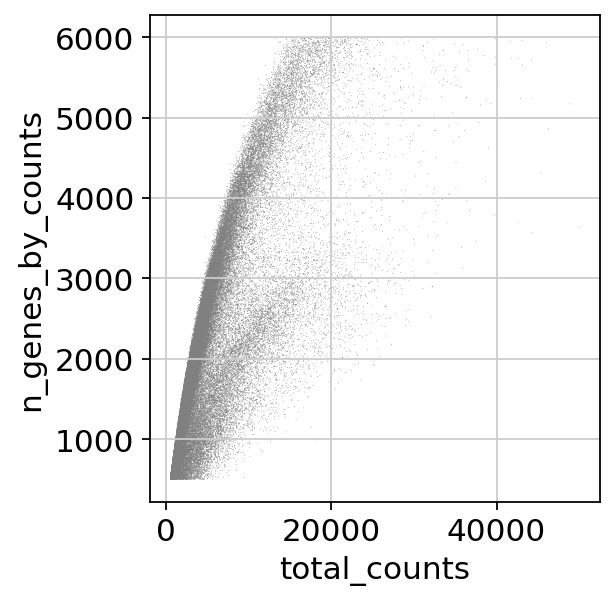

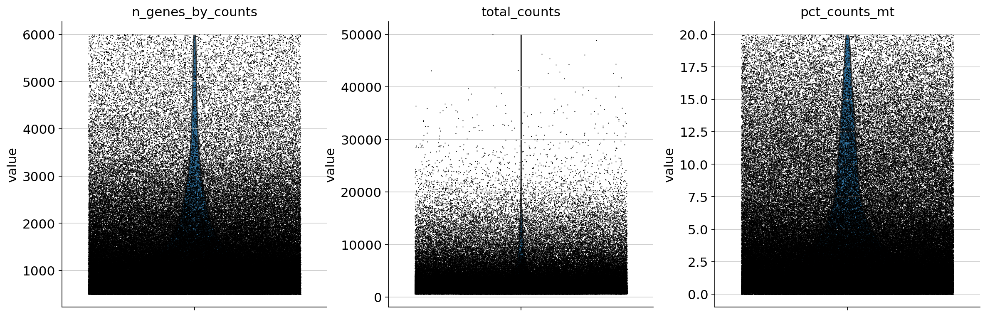

After QC: (224097, 18065)


In [19]:
print("Before QC:", adata.shape)

sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata = adata[(adata.obs.n_genes_by_counts >= 500) & (adata.obs.n_genes_by_counts <= 6000), :]
adata = adata[adata.obs.pct_counts_mt < 20, :].copy()
adata = adata[(adata.obs.total_counts >= 500) & (adata.obs.total_counts <= 50000), :]

sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)
print("After QC:", adata.shape)

In [23]:
print("Before QC:", adata.shape)
sc.pp.scrublet(adata, batch_key="batch")
print("After QC:", adata.shape)

Before QC: (224097, 18065)
After QC: (224097, 18065)


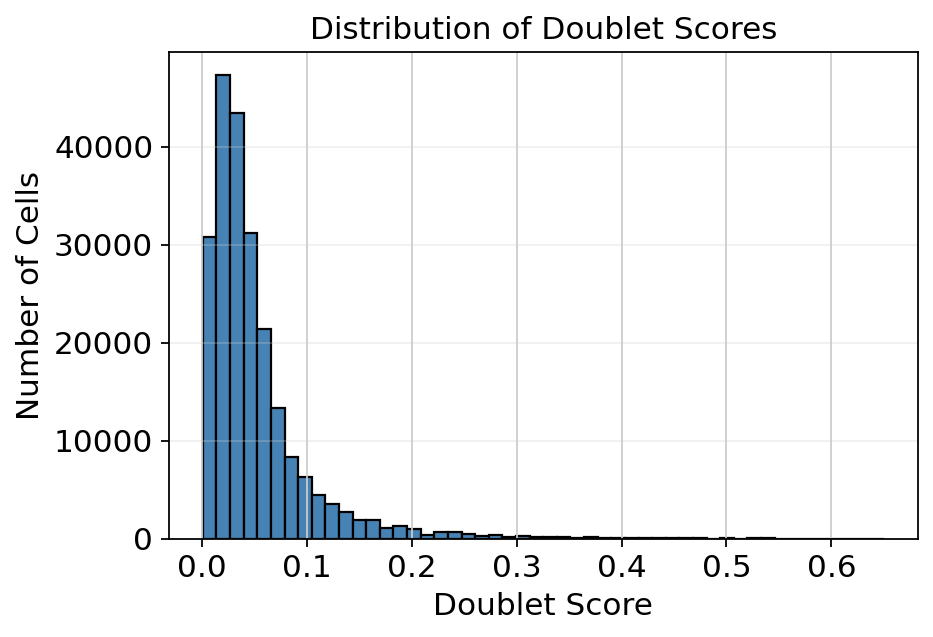

In [25]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
plt.hist(adata.obs['doublet_score'], bins=50, color='steelblue', edgecolor='black')
plt.xlabel('Doublet Score')
plt.ylabel('Number of Cells')
plt.title('Distribution of Doublet Scores')
plt.grid(axis='y', alpha=0.3)
plt.show()

In [26]:
threshold = 0.225
adata = adata[adata.obs['doublet_score'] <= threshold, :].copy()

print(f"Filtered cells: {adata.n_obs} left after doublet removal")

Filtered cells: 220913 left after doublet removal


In [27]:
adata.write("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/Before_HVG_raw.h5ad")

In [1]:
import scanpy as sc
h5ad_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/Before_HVG_raw.h5ad"
adata = sc.read_h5ad(h5ad_path)

In [2]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

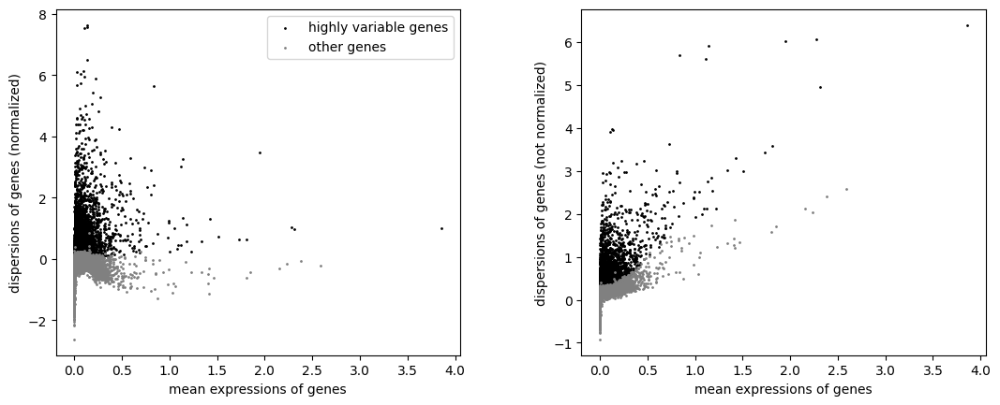

In [3]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000, batch_key="batch")
sc.pl.highly_variable_genes(adata)

In [4]:
adata = adata[:, adata.var['highly_variable']].copy()

# Clustering

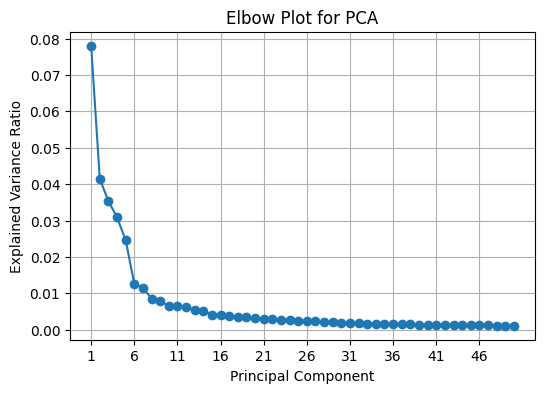

In [5]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

sc.tl.pca(adata)
explained_variance_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [6]:
sc.tl.pca(adata, n_comps=16)

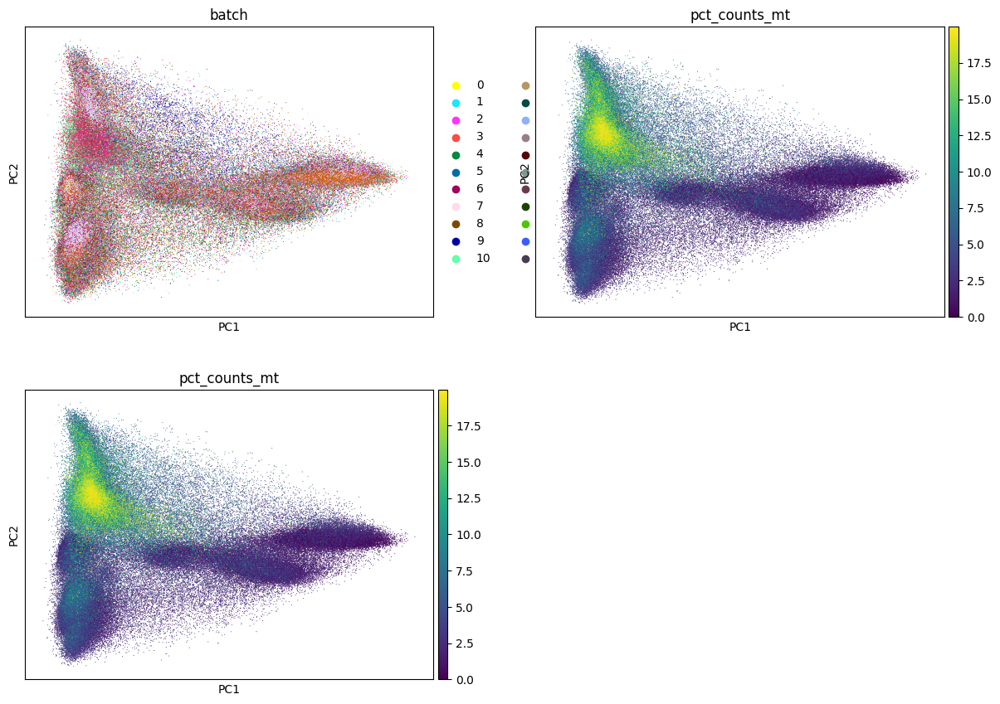

In [7]:
sc.pl.pca(
    adata,
    color=["batch", "pct_counts_mt", "pct_counts_mt"],
    ncols=2,
    size=2,
)

In [8]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

2025-06-30 23:56:18.953177: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751295379.073687 1910148 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751295379.106350 1910148 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1751295379.347858 1910148 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1751295379.347908 1910148 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1751295379.347912 1910148 computation_placer.cc:177] computation placer alr

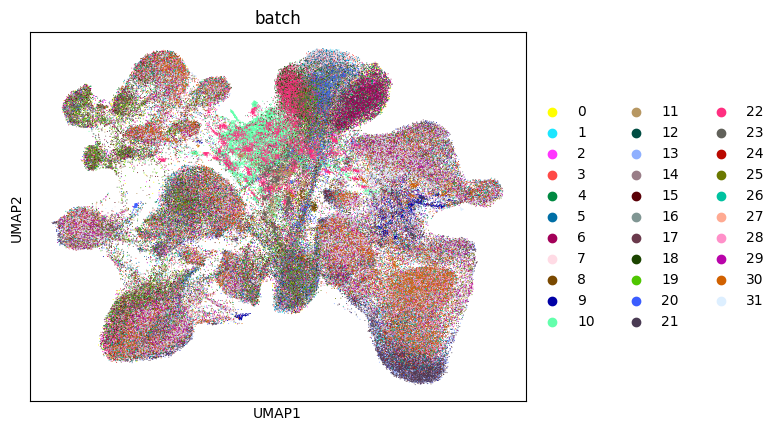

In [9]:
sc.pl.umap(
    adata,
    color="batch",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

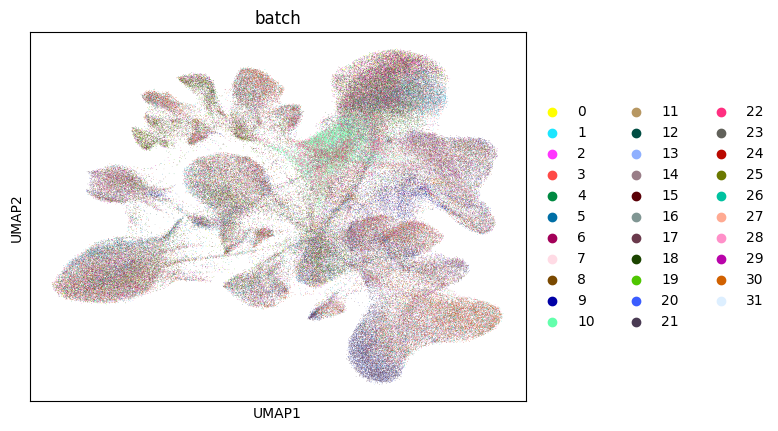

In [10]:
import anndata
import scanpy as sc
import pandas as pd
sc.external.pp.bbknn(adata, batch_key="batch")
sc.tl.umap(adata)
sc.pl.umap(adata, color=["batch"])

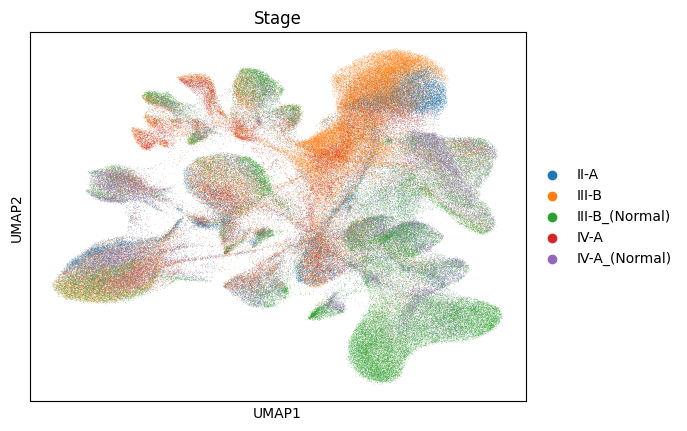

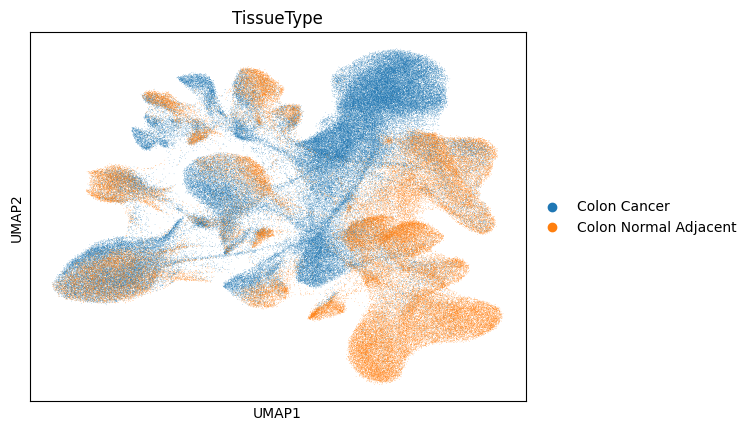

In [11]:
sc.pl.umap(adata, color=["Stage"])
sc.pl.umap(adata, color=["TissueType"])

In [19]:
for res in [0.02,0.1,0.25 , 0.5]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

Cluster 0: ['MZB1', 'TXNDC5', 'JCHAIN', 'SEC11C', 'XBP1', 'SSR4', 'TENT5C', 'DERL3', 'HERPUD1', 'FKBP11', 'POU2AF1', 'UBE2J1', 'PIM2', 'PDK1', 'TXNDC11']
Cluster 1: ['IGKC', 'MZB1', 'TXNDC5', 'XBP1', 'TENT5C', 'SSR4', 'JCHAIN', 'SEC11C', 'DERL3', 'POU2AF1', 'HERPUD1', 'FKBP11', 'PIM2', 'PDK1', 'UBE2J1']
Cluster 2: ['TRAC', 'TRBC2', 'ETS1', 'EVL', 'CD2', 'IKZF1', 'AKNA', 'CD3E', 'CXCR4', 'CD3D', 'CD96', 'LCP1', 'CORO1A', 'IL2RG', 'IL7R']
Cluster 3: ['CEACAM5', 'CEACAM6', 'CLDN4', 'RNF43', 'MYC', 'KLF5', 'ELF3', 'SLC12A2', 'MAL2', 'LRATD1', 'MYH14', 'S100P', 'MUC12', 'CDH1', 'DSP']
Cluster 4: ['IGKC', 'CEACAM5', 'CEACAM6', 'JCHAIN', 'IGHG1', 'IGHA1', 'LCN2', 'RGMB', 'SLC12A2', 'PHGR1', 'TFF3', 'CFTR', 'TXNDC5', 'CLDN4', 'MAL2']
Cluster 5: ['PIGR', 'LGALS4', 'PHGR1', 'MUC12', 'FXYD3', 'AGR2', 'C15orf48', 'CKB', 'FCGBP', 'CLDN7', 'HMGCS2', 'SLC44A4', 'TSPAN1', 'FABP1', 'GOLM1']
Cluster 6: ['COL6A2', 'COL3A1', 'C1S', 'DCN', 'COL1A2', 'COL6A3', 'COL6A1', 'LUM', 'C1R', 'MMP2', 'COL1A1', 'FBLN

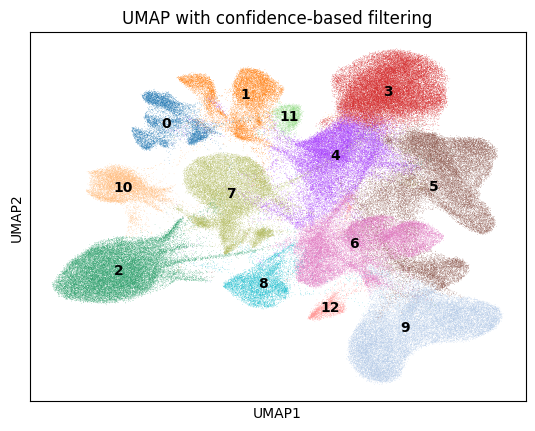

In [25]:
import scanpy as sc
sc.tl.rank_genes_groups(adata, groupby='leiden_res_0.25', method='t-test')  # 또는 'wilcoxon'

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names  # 클러스터 이름들

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:15]
    top_genes[group] = genes.tolist()

# 결과 확인
for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
sc.pl.umap(
    adata,
    color='leiden_res_0.25',
    title='UMAP with confidence-based filtering',
    legend_loc='on data'  # 또는 'right margin', 'none'
)


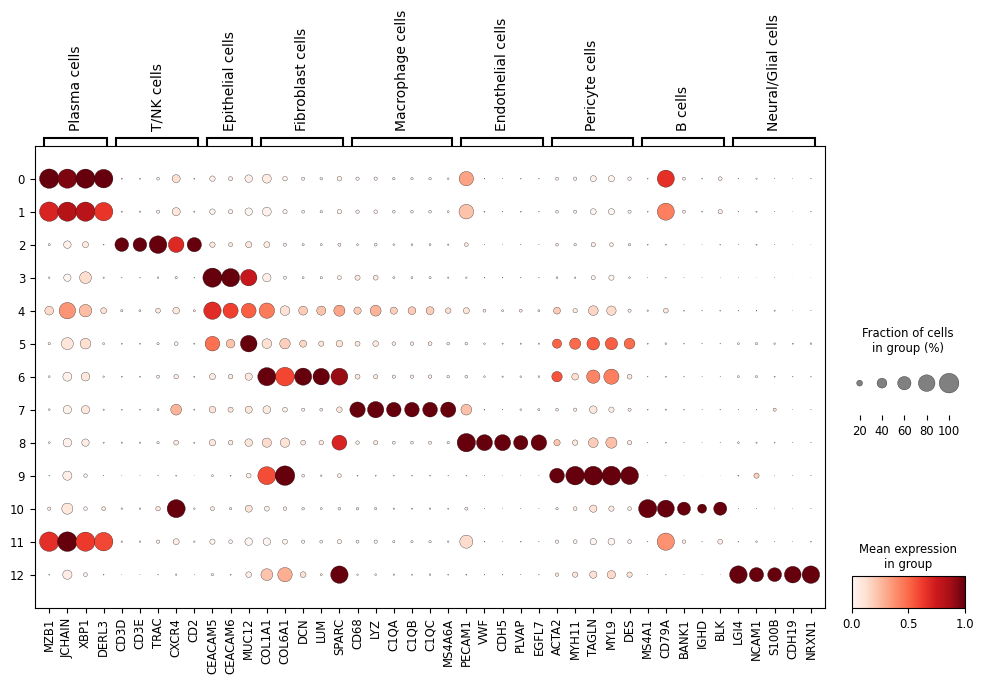

In [28]:
marker_genes = {
    # Plasma cells
    "Plasma cells": ['MZB1', 'JCHAIN', 'XBP1', 'SDC1', 'DERL3'],
    # T/NK cells
    "T/NK cells": ['CD3D', 'CD3E', 'TRAC', 'CXCR4', 'CD2'],
    # Epithelial (Tumor epithelial cells)
    "Epithelial cells": ['EPCAM', 'CEACAM5', 'KRT8', 'CEACAM6', 'MUC12', 'TSPAN8'],
    # Fibroblasts
    "Fibroblast cells": ['COL1A1', 'COL6A1', 'DCN', 'LUM', 'SPARC'],
    # Macrophages/Monocytes
    "Macrophage cells": ['CD68', 'LYZ', 'C1QA', 'C1QB', 'C1QC', 'MS4A6A'],
    # Endothelial cells
    "Endothelial cells": ['PECAM1', 'VWF', 'CDH5', 'PLVAP', 'EGFL7'],
    # Smooth muscle / Pericytes
    "Pericyte cells": ['ACTA2', 'MYH11', 'TAGLN', 'MYL9', 'DES'],
    # B cells
    "B cells": ['MS4A1', 'CD79A', 'BANK1', 'IGHD', 'BLK'],
    # Schwann/Glial
    "Neural/Glial cells": ['LGI4', 'NCAM1', 'S100B', 'CDH19', 'NRXN1'],
}

existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in marker_genes.items()}

existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(
    adata,
    existing_genes,
    groupby="leiden_res_0.25",
    standard_scale="var",
    dendrogram=False,
    swap_axes=False,
    figsize=(12, 6)
)


In [29]:
import numpy as np

conditions = [
    adata.obs['leiden_res_0.25'].isin(['0', '1', '11']),
    adata.obs['leiden_res_0.25'].isin(['2']),
    adata.obs['leiden_res_0.25'].isin(['3', '4', '5']),
    adata.obs['leiden_res_0.25'].isin(['6']),
    adata.obs['leiden_res_0.25'].isin(['7']),
    adata.obs['leiden_res_0.25'].isin(['8']),
    adata.obs['leiden_res_0.25'].isin(['9']),
    adata.obs['leiden_res_0.25'].isin(['10']),
    adata.obs['leiden_res_0.25'].isin(['12'])
]

annotations = [
    'Plasma cells',
    'T/NK cells',
    'Epithelial cells',
    'Fibroblast cells',
    'Macrophage cells',
    'Endothelial cells',
    'Pericyte cells',
    'B cells',
    'Neural/Glial cells'
]

adata.obs['annotation'] = np.select(conditions, annotations, default='Unknown')

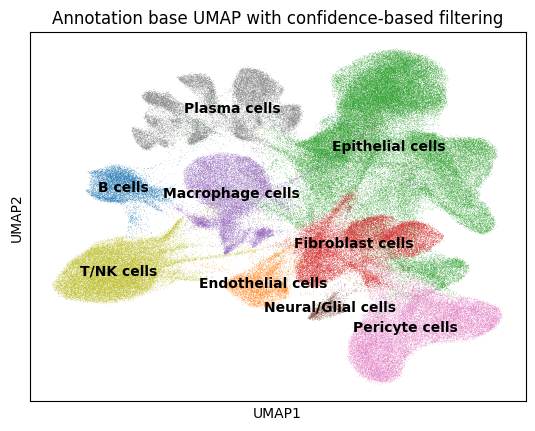

In [30]:
sc.pl.umap(
    adata,
    color='annotation',
    title='Annotation base UMAP with confidence-based filtering',
    legend_loc='on data'
)


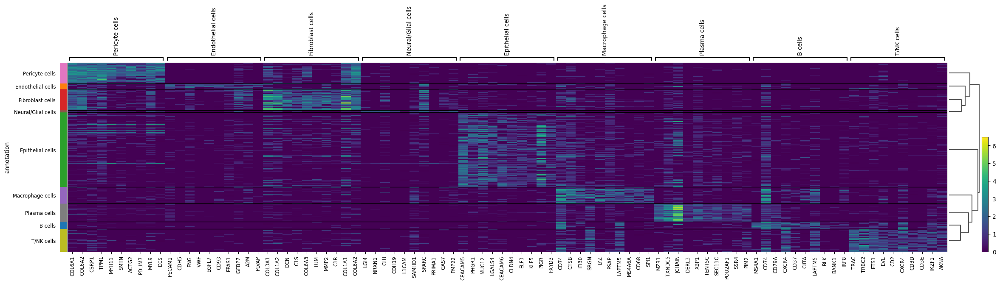

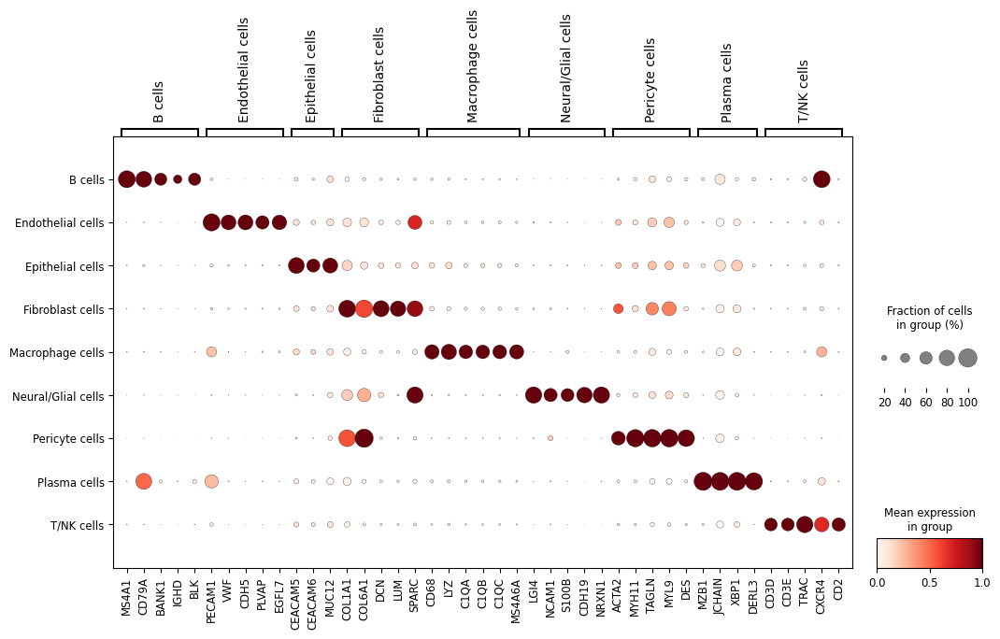

In [31]:
sc.tl.rank_genes_groups(
    adata,
    groupby='annotation',
    method='wilcoxon',
    n_genes=10
)
sc.pl.rank_genes_groups_heatmap(
    adata,
    groupby='annotation',
    n_genes=10,
    show_gene_labels=True,
    cmap='viridis'
)

marker_genes = {
    # B cells
    "B cells": ['MS4A1', 'CD79A', 'BANK1', 'IGHD', 'BLK'],
    # Endothelial cells
    "Endothelial cells": ['PECAM1', 'VWF', 'CDH5', 'PLVAP', 'EGFL7'],
    # Epithelial (Tumor epithelial cells)
    "Epithelial cells": ['EPCAM', 'CEACAM5', 'KRT8', 'CEACAM6', 'MUC12', 'TSPAN8'],
    # Fibroblasts
    "Fibroblast cells": ['COL1A1', 'COL6A1', 'DCN', 'LUM', 'SPARC'],
    # Macrophages/Monocytes
    "Macrophage cells": ['CD68', 'LYZ', 'C1QA', 'C1QB', 'C1QC', 'MS4A6A'],
    # Schwann/Glial
    "Neural/Glial cells": ['LGI4', 'NCAM1', 'S100B', 'CDH19', 'NRXN1'],
    # Smooth muscle / Pericytes
    "Pericyte cells": ['ACTA2', 'MYH11', 'TAGLN', 'MYL9', 'DES'],
    # Plasma cells
    "Plasma cells": ['MZB1', 'JCHAIN', 'XBP1', 'SDC1', 'DERL3'],
    # T/NK cells
    "T/NK cells": ['CD3D', 'CD3E', 'TRAC', 'CXCR4', 'CD2'],
}
existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in marker_genes.items()}

existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}


sc.pl.dotplot(
    adata,
    existing_genes,
    groupby="annotation",
    standard_scale="var",
    dendrogram=False,
    swap_axes=False,
    figsize=(12, 6)
)

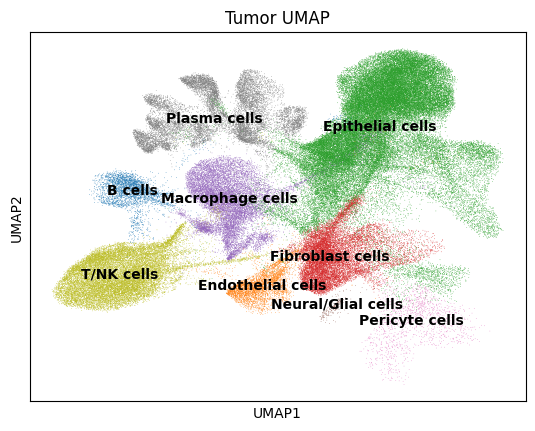

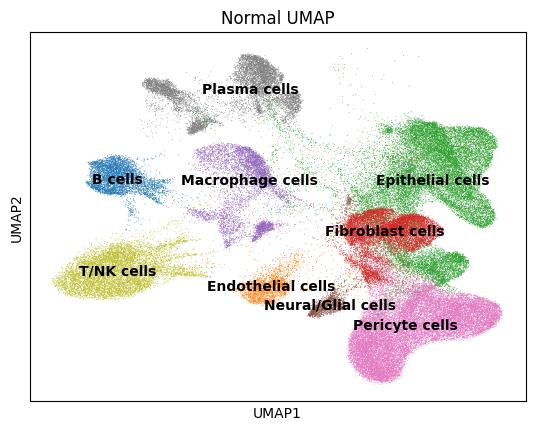

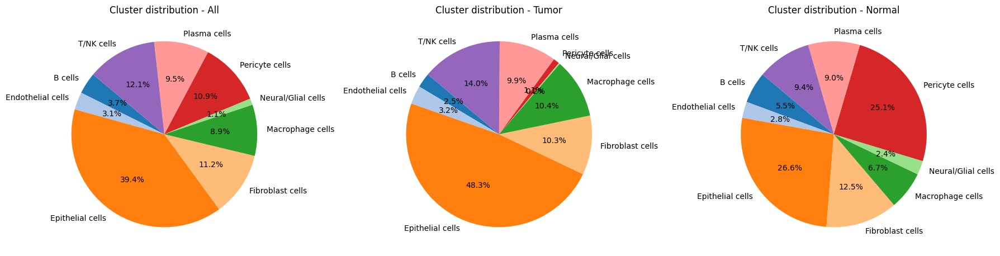

annotation
Epithelial cells      86944
T/NK cells            26799
Fibroblast cells      24752
Pericyte cells        24182
Plasma cells          21082
Macrophage cells      19650
B cells                8265
Endothelial cells      6760
Neural/Glial cells     2479
Name: count, dtype: int64
annotation
Epithelial cells      62844
T/NK cells            18233
Macrophage cells      13593
Fibroblast cells      13421
Plasma cells          12933
Endothelial cells      4190
B cells                3316
Pericyte cells         1382
Neural/Glial cells      272
Name: count, dtype: int64
annotation
Epithelial cells      24100
Pericyte cells        22800
Fibroblast cells      11331
T/NK cells             8566
Plasma cells           8149
Macrophage cells       6057
B cells                4949
Endothelial cells      2570
Neural/Glial cells     2207
Name: count, dtype: int64


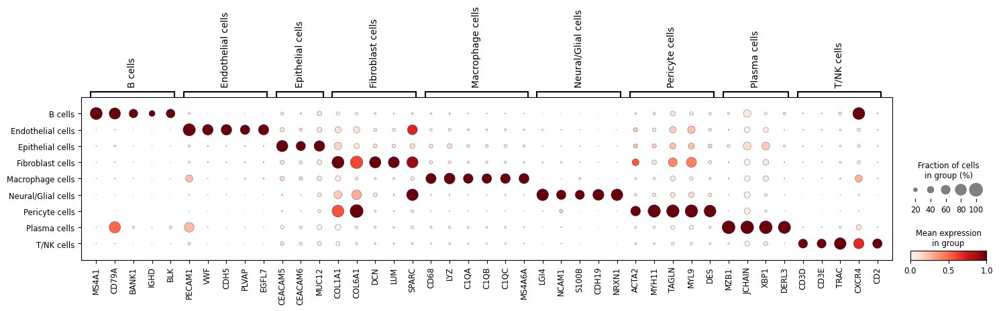

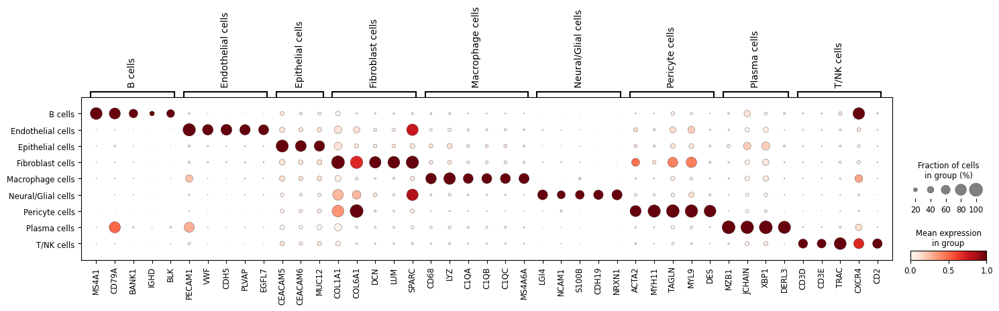

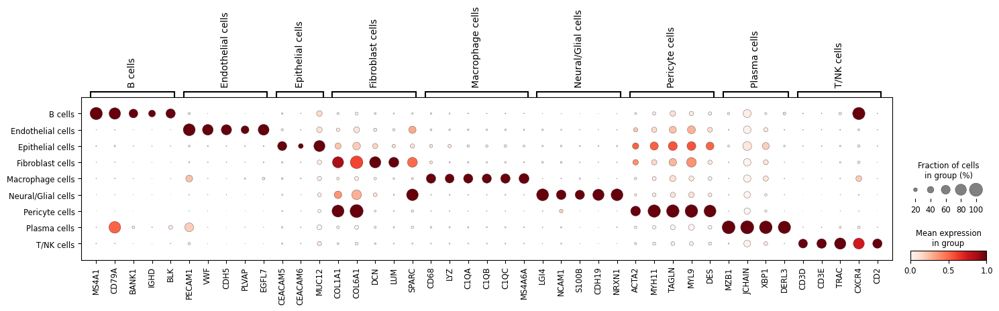

In [32]:
import matplotlib.pyplot as plt

adata_tumor = adata[adata.obs['TissueType'] == 'Colon Cancer'].copy()
adata_normal = adata[adata.obs['TissueType'] == 'Colon Normal Adjacent'].copy()

sc.pl.umap(
    adata_tumor,
    color=['annotation'],
    title='Tumor UMAP',
    legend_loc="on data")

sc.pl.umap(
    adata_normal,
    title='Normal UMAP',
    color=['annotation'],
    legend_loc="on data")

# 클러스터 비율 계산
total_counts = adata.obs['annotation'].value_counts().sort_index()
tumor_counts = adata_tumor.obs['annotation'].value_counts().sort_index()
normal_counts = adata_normal.obs['annotation'].value_counts().sort_index()

# 공통 라벨 확보
labels = sorted(set(total_counts.index).union(tumor_counts.index).union(normal_counts.index))

# 비율 계산
total_sizes = [total_counts.get(label, 0) for label in labels]
tumor_sizes = [tumor_counts.get(label, 0) for label in labels]
normal_sizes = [normal_counts.get(label, 0) for label in labels]

# 색상 지정
colors = plt.cm.tab20.colors[:len(labels)]

# 파이 플롯
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 전체 adata plot
axes[0].pie(total_sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
axes[0].set_title('Cluster distribution - All')

# Tumor plot
axes[1].pie(tumor_sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
axes[1].set_title('Cluster distribution - Tumor')

# Normal plot
axes[2].pie(normal_sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
axes[2].set_title('Cluster distribution - Normal')

plt.tight_layout()
plt.show()
print(adata.obs['annotation'].value_counts())
print(adata_tumor.obs['annotation'].value_counts())
print(adata_normal.obs['annotation'].value_counts())
sc.pl.dotplot(adata, existing_genes, groupby="annotation", standard_scale="var")
sc.pl.dotplot(adata_tumor, existing_genes, groupby="annotation", standard_scale="var")
sc.pl.dotplot(adata_normal, existing_genes, groupby="annotation", standard_scale="var")

In [33]:
adata.write("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/After_HVG_logNorm_clustering.h5ad")

# Infer CNV

In [34]:
import pandas as pd

gtf = pd.read_csv(
    "/home/Data_Drive_8TB/kykim/user/gencode.v42.annotation.gtf",
    sep='\t', comment='#', header=None,
    names=['chromosome','source','feature','start','end','score','strand','frame','attributes']
)
genes_df = gtf[gtf['feature']=='gene'].copy()
genes_df['gene_name'] = genes_df['attributes'].str.extract('gene_name "([^"]+)"')
genes_df = genes_df.set_index('gene_name')
genes_df = genes_df[['chromosome','start','end']]

genes_df = genes_df[~genes_df.index.duplicated(keep='first')]
common_genes = adata.var_names.intersection(genes_df.index)
adata_infercnv = adata[:, common_genes].copy()

gene_pos_df = genes_df.loc[adata_infercnv.var_names]  # index 순서 adata와 일치
adata_infercnv.var = adata_infercnv.var.join(gene_pos_df)

adata_infercnv


AnnData object with n_obs × n_vars = 220913 × 4935
    obs: 'TissueType', 'SampleID', 'Location', 'Stage', 'Gender', 'Age', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.02', 'leiden_res_0.25', 'leiden_res_0.50', 'leiden_res_2.00', 'leiden_res_0.10', 'annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_inter

In [54]:
import infercnvpy as cnv
cnv.tl.infercnv(
    adata_infercnv,
    reference_key='annotation',
    reference_cat=[
        "T/NK cells"
    ],
    window_size=50,
    step=10,
)


  0%|          | 0/45 [00:00<?, ?it/s]

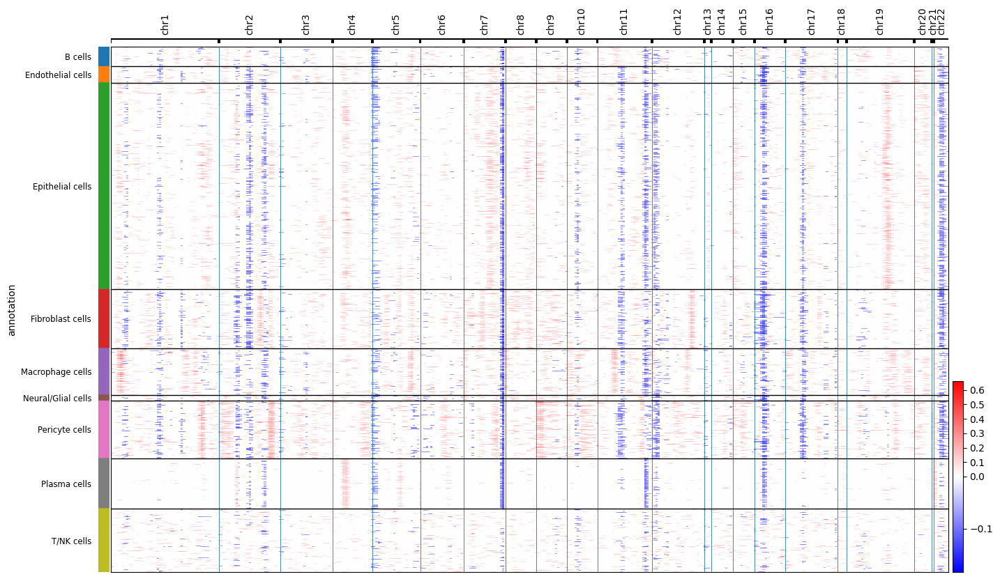

In [55]:
cnv.pl.chromosome_heatmap(adata_infercnv, groupby="annotation")

In [56]:
cnv.tl.pca(adata_infercnv)
cnv.pp.neighbors(adata_infercnv)
cnv.tl.leiden(adata_infercnv)

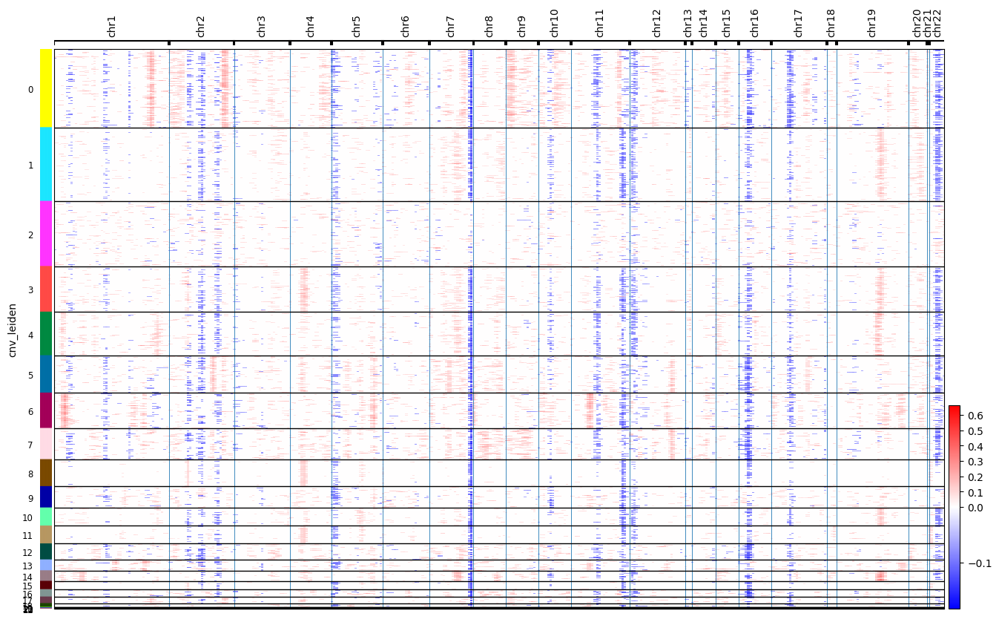

In [57]:
cnv.pl.chromosome_heatmap(adata_infercnv, groupby="cnv_leiden", dendrogram=False)

In [58]:
cnv.tl.umap(adata_infercnv)
cnv.tl.cnv_score(adata_infercnv)

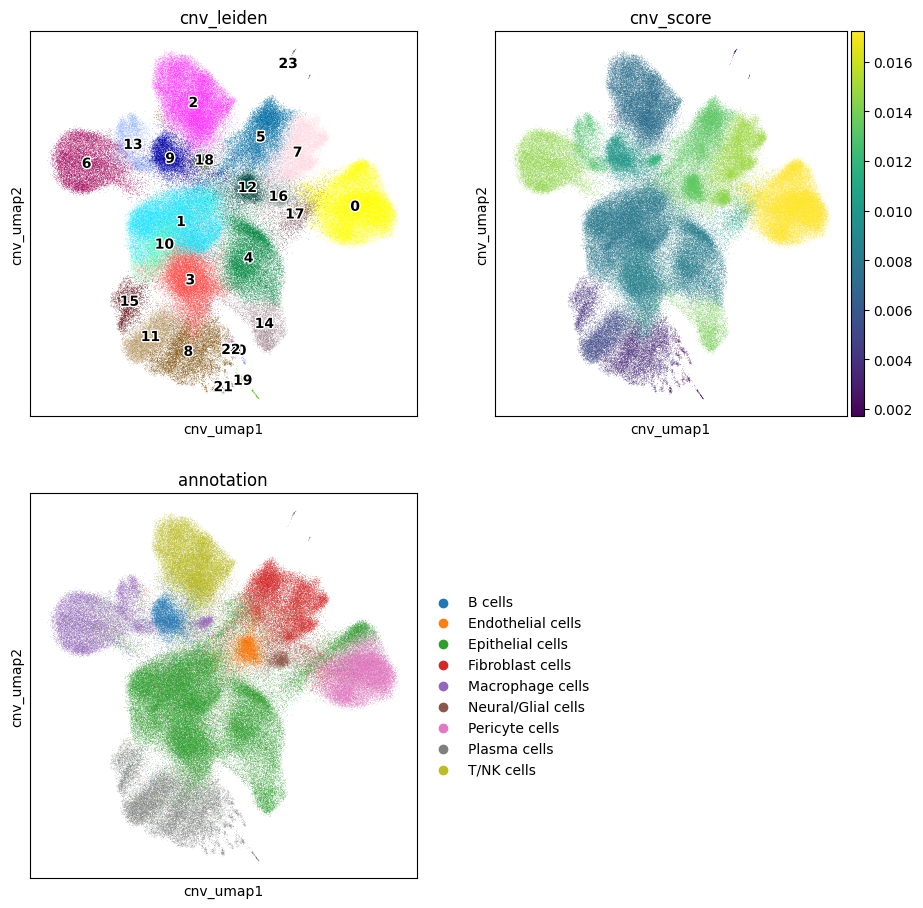

In [59]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")

cnv.pl.umap(
    adata_infercnv,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
cnv.pl.umap(adata_infercnv, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(adata_infercnv, color="annotation", ax=ax3)

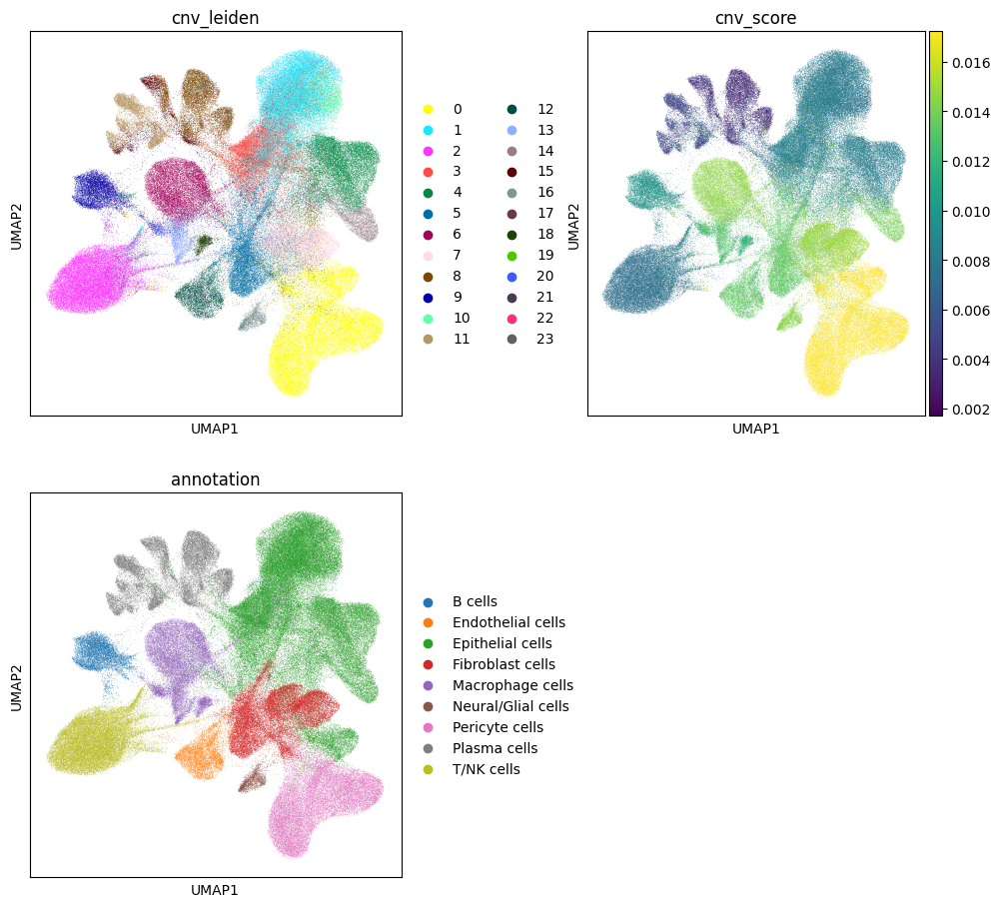

In [60]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
sc.pl.umap(adata_infercnv, color="cnv_leiden", ax=ax1, show=False)
sc.pl.umap(adata_infercnv, color="cnv_score", ax=ax2, show=False)
sc.pl.umap(adata_infercnv, color="annotation", ax=ax3)

/tmp/ipykernel_1910148/4070239858.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


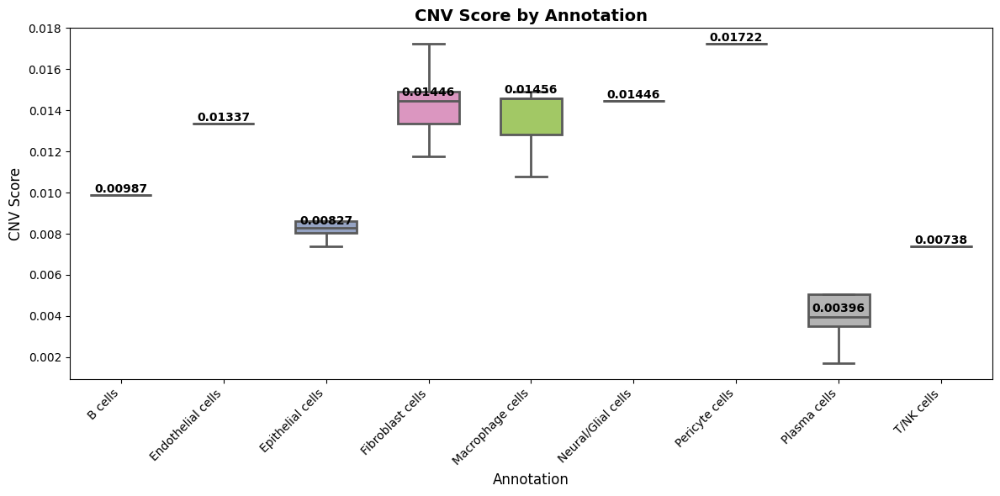

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.figure(figsize=(12, 6))

# boxplot 그리기
ax = sns.boxplot(
    x='annotation',
    y='cnv_score',
    data=adata_infercnv.obs,
    palette='Set2',
    width=0.6,
    linewidth=2,
    fliersize=0
)

# boxplot이 실제로 그린 x축 tick 순서 가져오기
xticks = [tick.get_text() for tick in ax.get_xticklabels()]

for i, cat in enumerate(xticks):
    vals = adata_infercnv.obs.loc[adata_infercnv.obs['annotation'] == cat, 'cnv_score']
    q1 = np.percentile(vals, 25)
    q3 = np.percentile(vals, 75)
    median = np.median(vals)
    y_pos = median + (q3 - q1)*0.08
    ax.text(
        i, y_pos,
        f"{median:.5f}",
        ha='center',
        va='bottom',
        color='black',
        fontweight='bold',
        fontsize=10
    )

plt.title('CNV Score by Annotation', fontsize=14, weight='bold')
plt.xlabel('Annotation', fontsize=12)
plt.ylabel('CNV Score', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [62]:
adata_infercnv.write("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/Total_inferCNV.h5ad")

In [173]:
#################### only Epithelial inferCNV ####################

In [63]:
Epithelial_infercnv = adata_infercnv[adata_infercnv.obs['annotation'] == 'Epithelial cells'].copy()

In [64]:
cnv.tl.pca(Epithelial_infercnv)
cnv.pp.neighbors(Epithelial_infercnv)
cnv.tl.leiden(Epithelial_infercnv)

In [65]:
cnv.tl.umap(Epithelial_infercnv)
cnv.tl.cnv_score(Epithelial_infercnv)

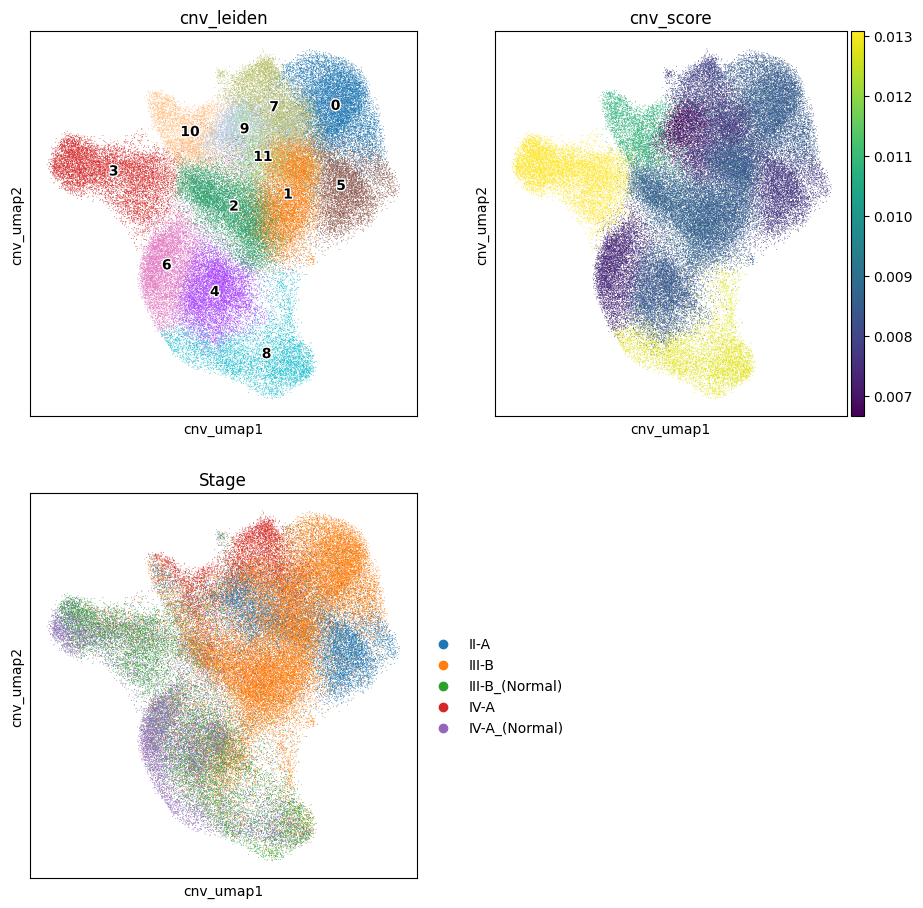

In [66]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
cnv.pl.umap(
    Epithelial_infercnv,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
cnv.pl.umap(Epithelial_infercnv, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(Epithelial_infercnv, color="Stage", ax=ax3)

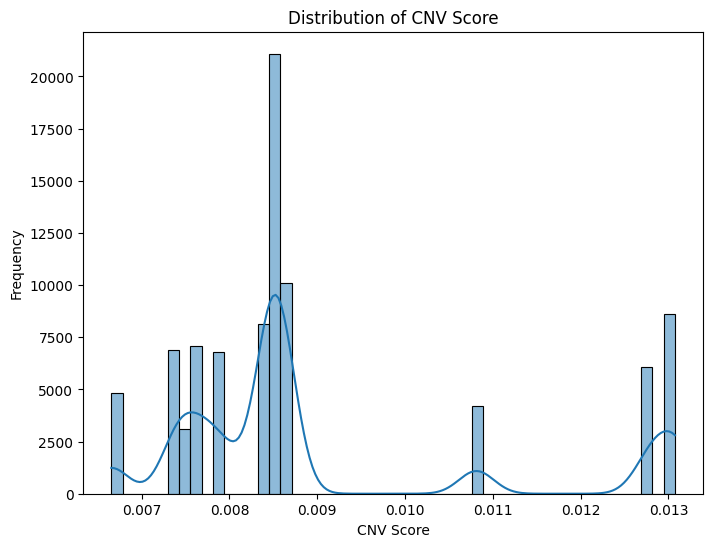

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.histplot(
    Epithelial_infercnv.obs['cnv_score'], 
    bins=50,       # bin 수 늘리기
    kde=True
)
plt.title('Distribution of CNV Score')
plt.xlabel('CNV Score')
plt.ylabel('Frequency')
plt.show()


In [68]:
import numpy as np

vals = Epithelial_infercnv.obs['cnv_score']

q1 = np.percentile(vals, 25)
q3 = np.percentile(vals, 75)
iqr = q3 - q1

def grade_cnv(score):
    if score < q1:
        return 'Low cnv'
    elif q1 <= score <= q3:
        return 'Median cnv'
    else:  # score > q3
        return 'High cnv'

Epithelial_infercnv.obs['cnv_grade'] = vals.apply(grade_cnv)

In [69]:
Epithelial_infercnv.obs['cnv_grade'].value_counts()

cnv_grade
Median cnv    53213
High cnv      18922
Low cnv       14809
Name: count, dtype: int64

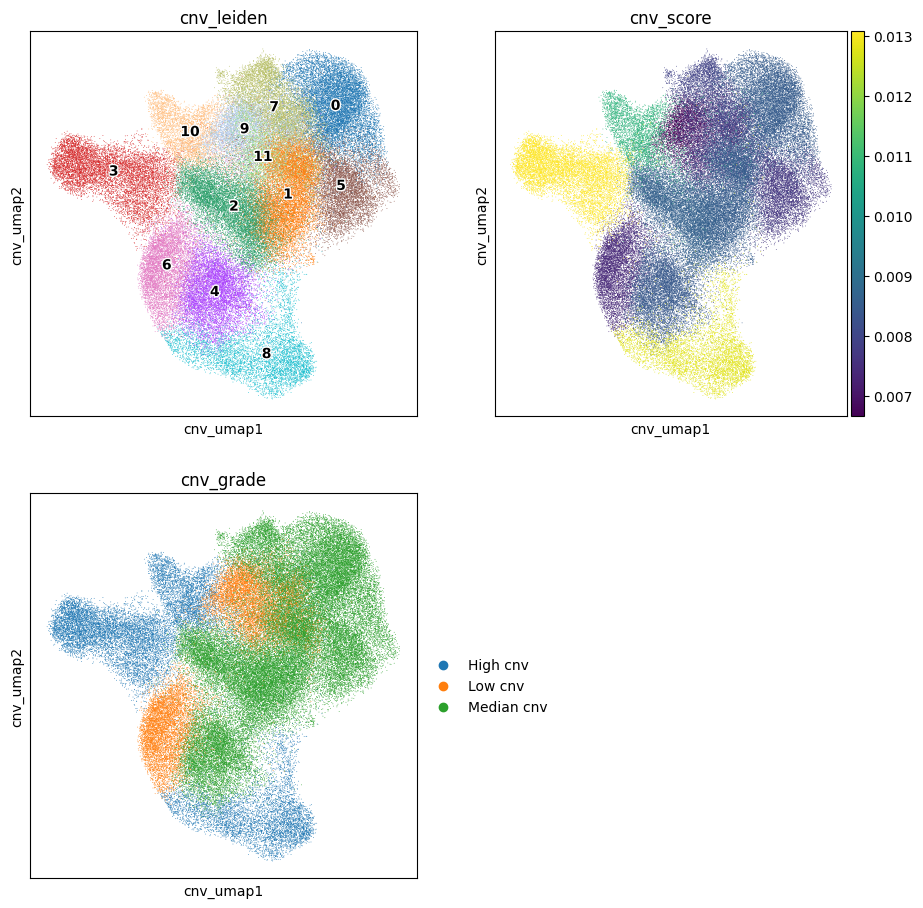

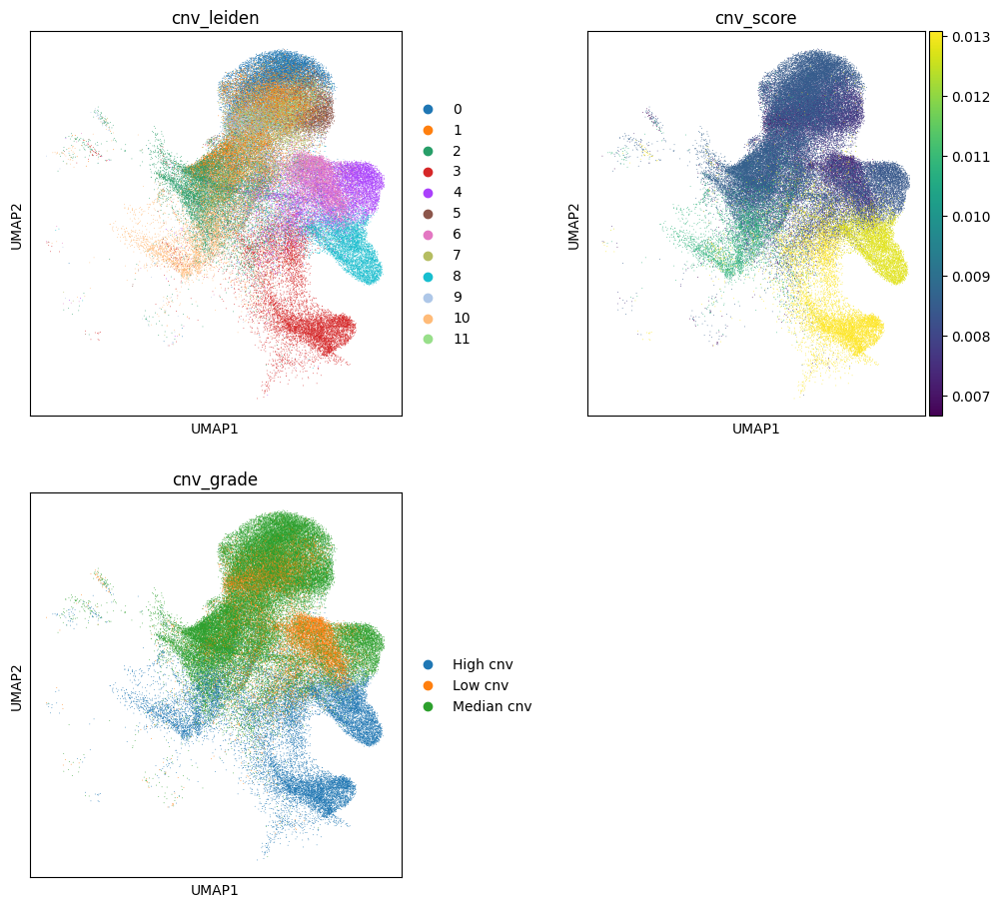

In [70]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(11, 11))
ax4.axis("off")
cnv.pl.umap(
    Epithelial_infercnv,
    color="cnv_leiden",
    legend_loc="on data",
    legend_fontoutline=2,
    ax=ax1,
    show=False,
)
cnv.pl.umap(Epithelial_infercnv, color="cnv_score", ax=ax2, show=False)
cnv.pl.umap(Epithelial_infercnv, color="cnv_grade", ax=ax3)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11), gridspec_kw={"wspace": 0.5})
ax4.axis("off")
sc.pl.umap(Epithelial_infercnv, color="cnv_leiden", ax=ax1, show=False)
sc.pl.umap(Epithelial_infercnv, color="cnv_score", ax=ax2, show=False)
sc.pl.umap(Epithelial_infercnv, color="cnv_grade", ax=ax3)

/tmp/ipykernel_1910148/4259734482.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['batch', 'cnv_grade'])
/tmp/ipykernel_1910148/4259734482.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


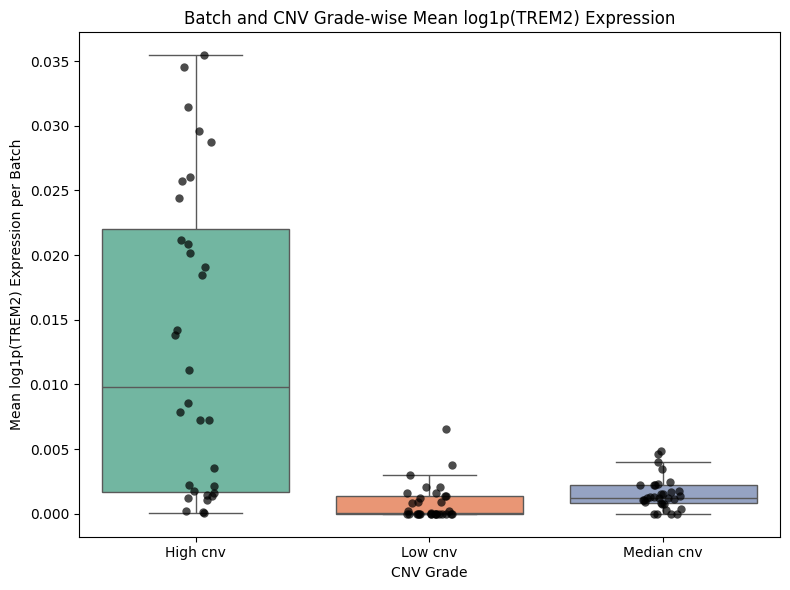

In [97]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 1. log1p 변환된 TREM2 발현 추가
Epithelial_infercnv.obs['TREM2_expr_log'] = np.log1p(
    Epithelial_infercnv[:, 'TREM2'].X.toarray().flatten()
)

# 2. batch와 cnv_grade별로 평균 TREM2 발현 계산
batch_cnv_means = (
    Epithelial_infercnv.obs
    .groupby(['batch', 'cnv_grade'])
    .agg(TREM2_mean=('TREM2_expr_log', 'mean'))
    .reset_index()
)

# 3. boxplot + dot plot
plt.figure(figsize=(8, 6))
sns.boxplot(
    data=batch_cnv_means,
    x='cnv_grade',
    y='TREM2_mean',
    palette='Set2',
    showfliers=False
)
sns.stripplot(
    data=batch_cnv_means,
    x='cnv_grade',
    y='TREM2_mean',
    color='black',
    size=6,
    jitter=True,
    alpha=0.7
)
plt.title('Batch and CNV Grade-wise Mean log1p(TREM2) Expression')
plt.xlabel('CNV Grade')
plt.ylabel('Mean log1p(TREM2) Expression per Batch')
plt.tight_layout()
plt.show()


/tmp/ipykernel_1910148/137817100.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(['batch', 'cnv_grade'])
/tmp/ipykernel_1910148/137817100.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


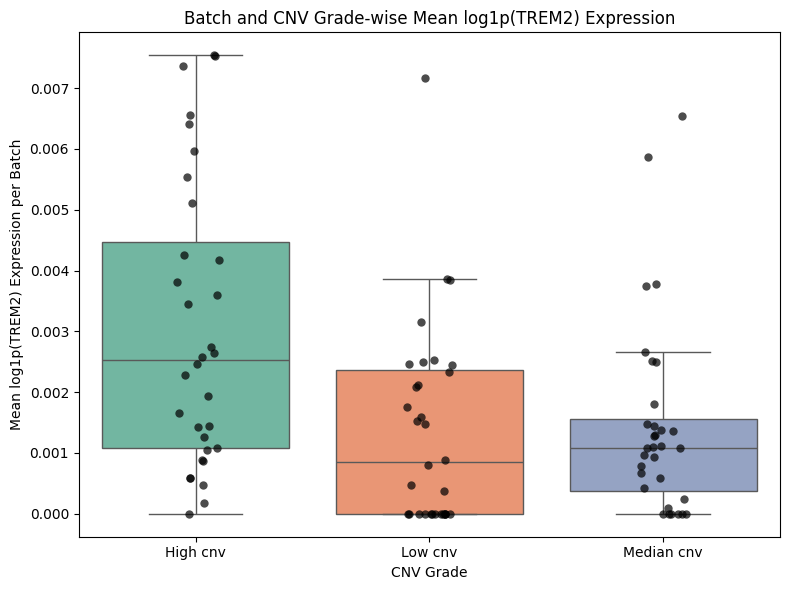

In [101]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 1. log1p 변환된 TREM2 발현 추가
Epithelial_infercnv.obs['TREM2_expr_log'] = np.log1p(
    Epithelial_infercnv[:, 'CTLA4'].X.toarray().flatten()
)

# 2. batch와 cnv_grade별로 평균 TREM2 발현 계산
batch_cnv_means = (
    Epithelial_infercnv.obs
    .groupby(['batch', 'cnv_grade'])
    .agg(TREM2_mean=('TREM2_expr_log', 'mean'))
    .reset_index()
)

# 3. boxplot + dot plot
plt.figure(figsize=(8, 6))
sns.boxplot(
    data=batch_cnv_means,
    x='cnv_grade',
    y='TREM2_mean',
    palette='Set2',
    showfliers=False
)
sns.stripplot(
    data=batch_cnv_means,
    x='cnv_grade',
    y='TREM2_mean',
    color='black',
    size=6,
    jitter=True,
    alpha=0.7
)
plt.title('Batch and CNV Grade-wise Mean log1p(TREM2) Expression')
plt.xlabel('CNV Grade')
plt.ylabel('Mean log1p(TREM2) Expression per Batch')
plt.tight_layout()
plt.show()


# Pathway Derived Subtyping

In [1]:
import scanpy as sc
h5ad_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/Before_HVG_raw.h5ad"
Total = sc.read_h5ad(h5ad_path)

In [127]:
h5ad_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/After_HVG_logNorm_clustering.h5ad"
Clustering = sc.read_h5ad(h5ad_path)

In [128]:
import pandas as pd
import numpy as np

# 1. Epithelial cells인 index만 추출
epithelial_idx = Clustering.obs[Clustering.obs['annotation'] == 'Epithelial cells'].index

# 2. Total.obs에 새로운 열 추가: 일치하는 index만 'Epithelial cells', 나머지는 NaN
Total.obs['annotation'] = np.where(Total.obs.index.isin(epithelial_idx), 'Epithelial cells', np.nan)

In [129]:
Epithelial = Total[Total.obs['annotation'] == 'Epithelial cells'].copy()

In [ ]:
Epithelial.write("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/Epithelial.h5ad")

In [1]:
import scanpy as sc
h5ad_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/Epithelial.h5ad"
Epithelial = sc.read_h5ad(h5ad_path)

In [2]:
Epithelial

AnnData object with n_obs × n_vars = 86944 × 18065
    obs: 'TissueType', 'SampleID', 'Location', 'Stage', 'Gender', 'Age', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'

In [3]:
###################### Normalization  Epithelial
sc.pp.normalize_total(Epithelial)
sc.pp.log1p(Epithelial)
# sc.pp.highly_variable_genes(Epithelial, n_top_genes=3000, batch_key="batch")
#Epithelial = Epithelial[:, Epithelial.var['highly_variable']].copy()

In [8]:
Epithelial.write("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/save_point/Epithelial_lognorm.h5ad")

In [4]:
import pandas as pd

# 파일 경로
file_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/PDSclassifier/single_epithelial.parquet"

# parquet 파일 읽기
df = pd.read_parquet(file_path,engine="fastparquet")

In [5]:
df_indexed = df.set_index("Sample_ID")
Epithelial.obs["PDS1"] = Epithelial.obs.index.map(df_indexed["PDS1"])
Epithelial.obs["PDS2"] = Epithelial.obs.index.map(df_indexed["PDS2"])
Epithelial.obs["PDS3"] = Epithelial.obs.index.map(df_indexed["PDS3"])
Epithelial.obs["PDS"] = Epithelial.obs.index.map(df_indexed["PDS_call"])

/tmp/ipykernel_2894508/368620839.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby([key, "PDS"]).size().reset_index(name="count")


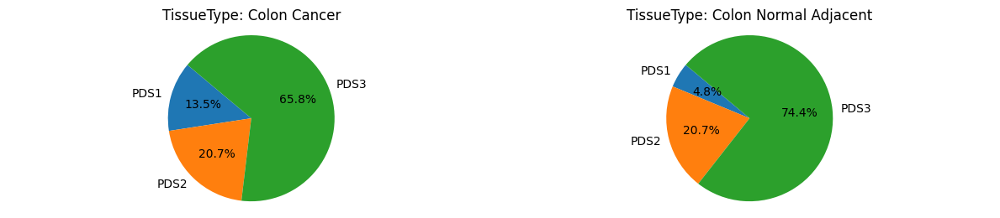

/tmp/ipykernel_2894508/368620839.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby([key, "PDS"]).size().reset_index(name="count")


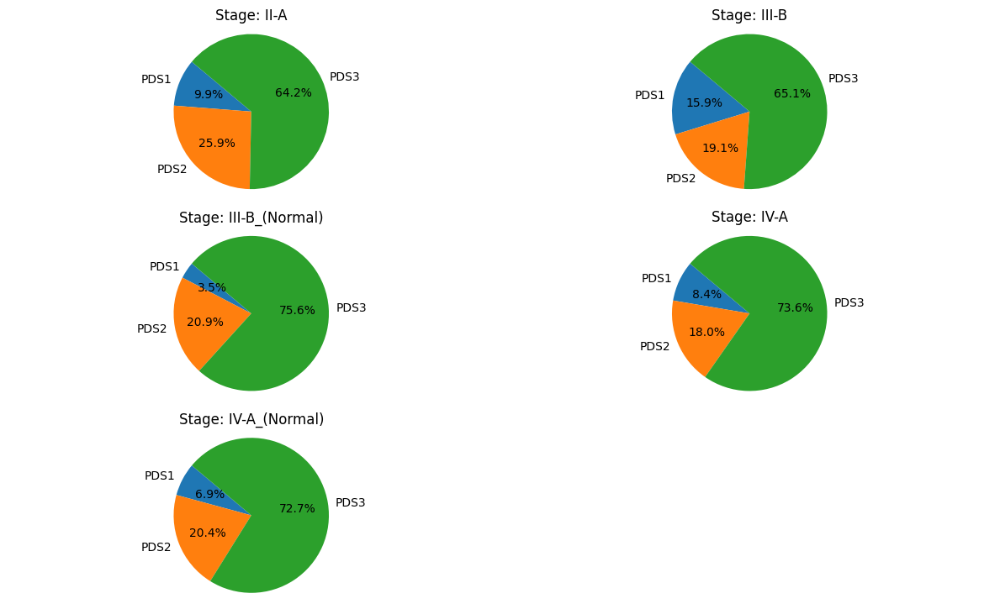

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

# 🔹 Mixed 제외
df = Epithelial.obs[Epithelial.obs["PDS"] != "Mixed"].copy()

# 🔹 PDS를 문자열로 처리 (범주형 잔재 제거)
df["PDS"] = df["PDS"].astype(str)

# 🔹 PDS 비율을 보고 싶은 기준
group_keys = ["TissueType", "Stage"]

for key in group_keys:
    grouped = df.groupby([key, "PDS"]).size().reset_index(name="count")
    unique_values = grouped[key].unique()

    # 최대 6개만 그림
    n_plot = min(6, len(unique_values))
    fig, axes = plt.subplots(3, 2, figsize=(12, 8))
    axes = axes.flatten()

    for i, value in enumerate(unique_values[:6]):
        subset = grouped[grouped[key] == value].copy()

        # 🔹 혹시 모르니 여기서도 Mixed 제거 (이중 안전망)
        subset = subset[subset["PDS"] != "Mixed"]

        labels = subset["PDS"]
        sizes = subset["count"]

        ax = axes[i]
        ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
        ax.set_title(f"{key}: {value}")
        ax.axis("equal")

    # 남은 subplot 비우기
    for j in range(len(unique_values[:6]), 6):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


In [7]:
import numpy as np
import pandas as pd

# 유전자 리스트
immuno_genes = [
    "NT5E", "ENTPD1", "CTLA4", "HIF1A", "IL10", "IL17A", "IL1B", "CXCL8", "LAG3",
    "CD274", "PDCD1LG2", "TGFB1", "HAVCR2", "VEGFA", "B2M"
]
inflam_genes = [
    "C1QA", "C1QB", "C1QC", "C5", "IFNG", "IL12A", "IL12B", "IL15", "IL17F", "IL2",
    "IL23A", "IL33", "IL6", "TNF"
]
antipres_genes = [
    "B2M", "TAP1", "TAP2", "PSMB8", "PSMB9","NLRC5", "IRF1", "STAT1"
]
mhc_i_filtered = [
    'B2M', 'TAP1', 'TAP2', 'TAPBP', 'CALR', 'CANX', 'PDIA3',
    'PSMB8', 'PSMB9', 'PSMB10', 'PSME1', 'PSME2',
    'ERAP1', 'ERAP2', 'NLRC5', 'IRF1', 'STAT1'
]
mhc_ii_filtered = [
    'CD74', 'CTSS', 'CTSL', 'CTSA',
    'LGMN', 'RFX5', 'RFXAP', 'RFXANK', 'CIITA', 'IFNG'
]

# 스코어링 함수 정의
def score_genes(adata, gene_list, score_name):
    valid_genes = [gene for gene in gene_list if gene in adata.var_names]
    if len(valid_genes) == 0:
        print(f"[Warning] No valid genes found for {score_name}")
        adata.obs[score_name] = 0
    else:
        adata.obs[score_name] = adata[:, valid_genes].X.mean(axis=1).A1 \
            if not isinstance(adata[:, valid_genes].X, np.ndarray) \
            else adata[:, valid_genes].X.mean(axis=1)

# 적용
score_genes(Epithelial, immuno_genes, "immunesuppressive_score")
score_genes(Epithelial, inflam_genes, "inflammatory_score")
score_genes(Epithelial, mhc_i_filtered, "MHC_I_score")
score_genes(Epithelial, mhc_ii_filtered, "MHC_II_score")


/tmp/ipykernel_2894508/684872533.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="PDS", y=score_col, data=sub_df, ax=ax, palette="Set2", showfliers=False)
/tmp/ipykernel_2894508/684872533.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="PDS", y=score_col, data=sub_df, ax=ax, palette="Set2", showfliers=False)
/tmp/ipykernel_2894508/684872533.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="PDS", y=score_col, data=sub_df, ax=ax, palette="Set2", showfliers=False)
/tmp/ipykernel_2894508/684872533.py:31: FutureWarning: 

Pass

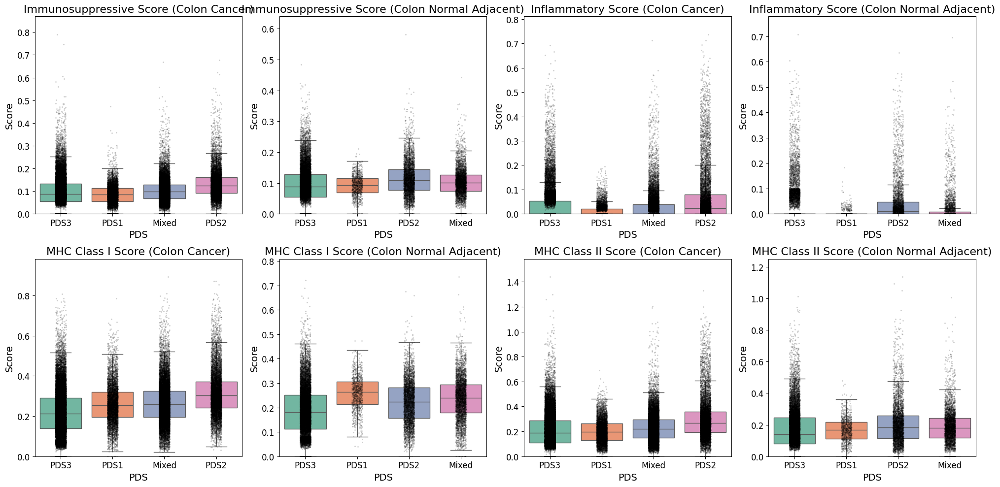

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 필요한 컬럼만 추출
df = Epithelial.obs[
    ["PDS", "TissueType", "immunesuppressive_score", "inflammatory_score", "MHC_I_score", "MHC_II_score"]
].copy()

# 컬럼 이름과 제목 매핑
score_columns = [
    ("immunesuppressive_score", "Immunosuppressive Score"),
    ("inflammatory_score", "Inflammatory Score"),
    ("MHC_I_score", "MHC Class I Score"),
    ("MHC_II_score", "MHC Class II Score"),
]

# TissueType 값 확인
tissue_types = df["TissueType"].unique()

# 전체 subplot 생성 (2행 × 4열: 각 score × 2 tissue type)
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, (score_col, score_title) in enumerate(score_columns):
    for j, tissue in enumerate(tissue_types):
        ax = axes[i * 2 + j]  # 각 score당 2개의 plot (Normal, Tumor)

        sub_df = df[df["TissueType"] == tissue]

        sns.boxplot(x="PDS", y=score_col, data=sub_df, ax=ax, palette="Set2", showfliers=False)
        sns.stripplot(x="PDS", y=score_col, data=sub_df, ax=ax, color='k', alpha=0.2, jitter=True, dodge=True, size=2)

        # y축 범위 설정
        max_val = sub_df[score_col].max()
        ax.set_ylim(0, max_val * 1.1)

        # 제목, 축 라벨 등 설정
        ax.set_title(f"{score_title} ({tissue})", fontsize=16)
        ax.set_xlabel("PDS", fontsize=14)
        ax.set_ylabel("Score", fontsize=14)
        ax.tick_params(axis='x', labelsize=12)
        ax.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.show()


/tmp/ipykernel_3310770/3132816500.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_scores = df.groupby("PDS")[col].mean().reset_index()
/tmp/ipykernel_3310770/3132816500.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="PDS", y=col, data=mean_scores, ax=ax, palette="Set2", edgecolor="black")
/tmp/ipykernel_3310770/3132816500.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_scores = df.groupby("PDS")[col].mean().reset_index()
/tmp/ipykern

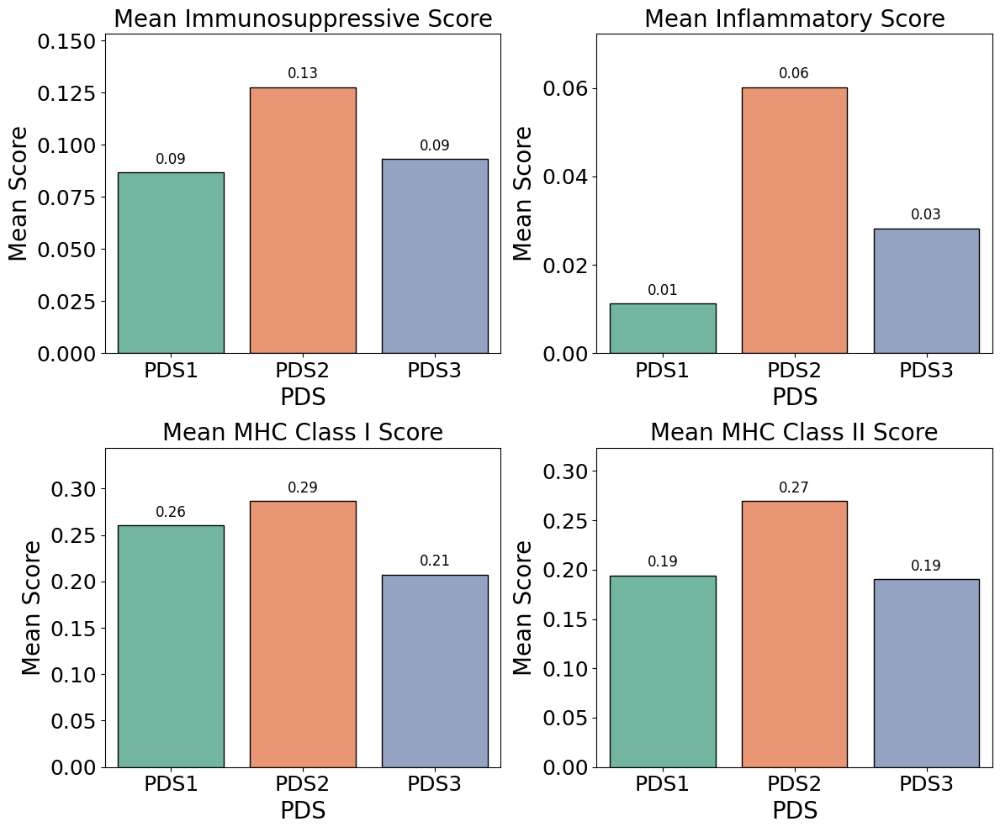

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 필요한 데이터 추출
df = Epithelial.obs[[
    "PDS",
    "immunesuppressive_score",
    "inflammatory_score",
    "MHC_I_score",
    "MHC_II_score"
]].copy()

# PDS 순서 고정
df["PDS"] = pd.Categorical(df["PDS"], categories=["PDS1", "PDS2", "PDS3"], ordered=True)

# 시각화할 컬럼과 타이틀 매핑
score_columns = [
    ("immunesuppressive_score", "Mean Immunosuppressive Score"),
    ("inflammatory_score", "Mean Inflammatory Score"),
    ("MHC_I_score", "Mean MHC Class I Score"),
    ("MHC_II_score", "Mean MHC Class II Score"),
]

# 2행 2열 subplot 생성
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for ax, (col, title) in zip(axes, score_columns):
    # PDS별 평균 계산
    mean_scores = df.groupby("PDS")[col].mean().reset_index()

    # barplot 그리기
    sns.barplot(x="PDS", y=col, data=mean_scores, ax=ax, palette="Set2", edgecolor="black")

    # y축 상한 자동 조정
    max_val = mean_scores[col].max()
    ax.set_ylim(0, max_val * 1.2)

    # 제목/레이블/눈금 폰트 크기 설정
    ax.set_title(title, fontsize=20)
    ax.set_xlabel("PDS", fontsize=20)
    ax.set_ylabel("Mean Score", fontsize=20)
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)

    # 바 위에 숫자 표시 (폰트 크기 포함)
    for i, v in enumerate(mean_scores[col]):
        ax.text(i, v + max_val * 0.02, f"{v:.2f}", ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()


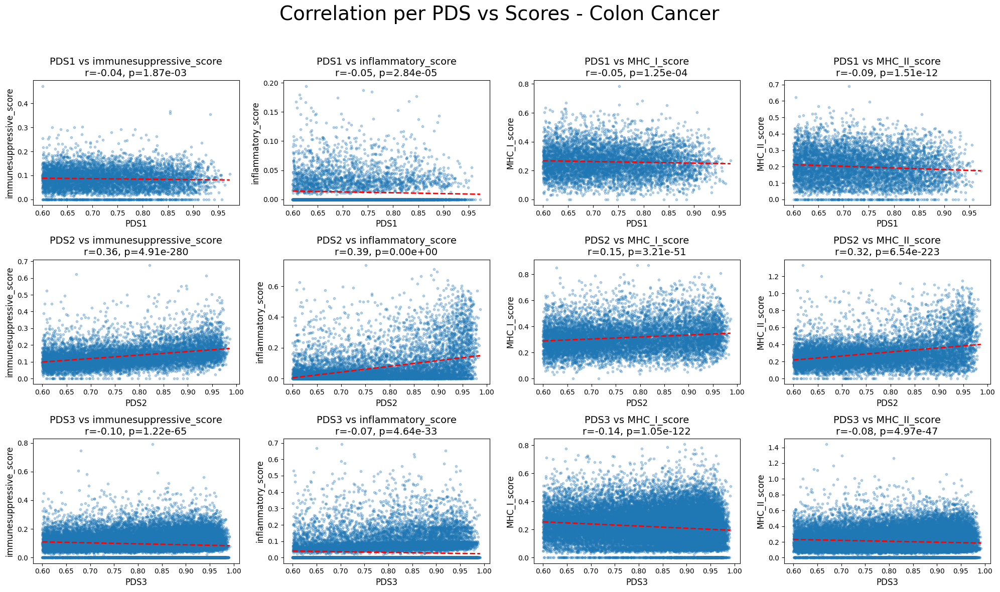

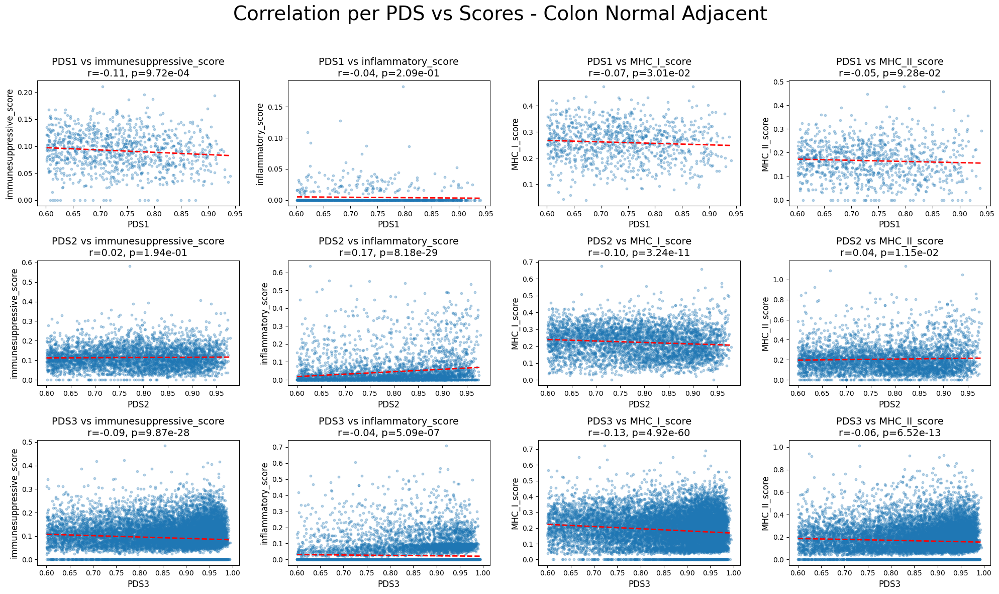

In [13]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr

score_cols = ['immunesuppressive_score', 'inflammatory_score', 'MHC_I_score', 'MHC_II_score']
pds_list = ['PDS1', 'PDS2', 'PDS3']
tissue_types = Epithelial.obs['TissueType'].unique()

for tissue in tissue_types:
    fig, axes = plt.subplots(len(pds_list), len(score_cols), figsize=(20, 12))
    axes = np.array(axes).reshape(len(pds_list), len(score_cols))
    fig.suptitle(f"Correlation per PDS vs Scores - {tissue}", fontsize=28)

    for i, pds_group in enumerate(pds_list):
        subset = Epithelial.obs[
            (Epithelial.obs['PDS'] == pds_group) &
            (Epithelial.obs['TissueType'] == tissue)
        ]
        pds_col = pds_group

        for j, score_col in enumerate(score_cols):
            ax = axes[i, j]

            x = subset[pds_col].values
            y = subset[score_col].values
            valid = ~np.isnan(x) & ~np.isnan(y)

            if np.sum(valid) > 2:
                corr, pval = pearsonr(x[valid], y[valid])
                ax.scatter(x[valid], y[valid], alpha=0.3, s=10)

                # 회귀선
                slope, intercept = np.polyfit(x[valid], y[valid], 1)
                x_fit = np.linspace(np.min(x[valid]), np.max(x[valid]), 100)
                y_fit = slope * x_fit + intercept
                ax.plot(x_fit, y_fit, 'r--', linewidth=2)

                ax.set_title(f"{pds_col} vs {score_col}\nr={corr:.2f}, p={pval:.2e}", fontsize=14)
            else:
                ax.set_title(f"{pds_col} vs {score_col}\nNot enough data", fontsize=14)

            ax.set_xlabel(pds_col, fontsize=12)
            ax.set_ylabel(score_col, fontsize=12)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [14]:
Epithelial

AnnData object with n_obs × n_vars = 86944 × 18065
    obs: 'TissueType', 'SampleID', 'Location', 'Stage', 'Gender', 'Age', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet', 'annotation', 'PDS1', 'PDS2', 'PDS3', 'PDS', 'immunesuppressive_score', 'inflammatory_score', 'MHC_I_score', 'MHC_II_score'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet', 'log1p'

In [ ]:
# Pathway analysis

In [58]:
Epithelial_PDS = Epithelial[
    Epithelial.obs['PDS'].isin(['PDS1', 'PDS2', 'PDS3'])
].copy()


In [67]:
result_df

,PDS1_names,PDS1_pvals_adj,PDS1_logfoldchanges,PDS1_scores,PDS2_names,PDS2_pvals_adj,PDS2_logfoldchanges,PDS2_scores,PDS3_names,PDS3_pvals_adj,PDS3_logfoldchanges,PDS3_scores
0,HIST1H1B,0.000000e+00,2.096869,66.459930,GRB2,0.000000e+00,1.296035,77.602020,IGKC,3.632092e-197,0.630844,29.994776
1,MCM7,0.000000e+00,1.636893,65.492912,STAT3,0.000000e+00,0.889091,70.733635,PIGR,6.522774e-107,0.669737,22.003380
2,HSPD1,0.000000e+00,1.424254,64.595421,TIMP2,0.000000e+00,1.477177,70.223938,ITM2C,5.272345e-18,0.197323,8.707245
3,MCM4,0.000000e+00,2.042058,63.540524,LGALS1,0.000000e+00,1.509645,70.210983,TSPAN8,3.273187e-17,0.145179,8.497211
4,PRKDC,0.000000e+00,1.482588,63.024078,UBC,0.000000e+00,0.880769,69.841347,LGALS4,2.016962e-15,0.237686,8.003435
...,...,...,...,...,...,...,...,...,...,...,...,...
18060,COL6A1,1.230251e-263,-3.192862,-34.793816,PHGR1,1.829429e-55,-0.285633,-15.734967,SNRPB,0.000000e+00,-0.875672,-70.884666
18061,IGKC,2.765728e-264,-1.433572,-34.836910,MT-ND1,5.781362e-58,-0.175098,-16.096048,UBC,0.000000e+00,-0.779916,-71.761169
18062,VIM,3.464293e-270,-2.509933,-35.225937,MT-ND4L,3.371763e-61,-0.119629,-16.551455,CNN3,0.000000e+00,-0.846174,-71.874321
18063,TAGLN,0.000000e+00,-3.522392,-38.247341,MT-CO3,4.586696e-67,-0.174411,-17.347212,GRB2,0.000000e+00,-1.158710,-74.965820


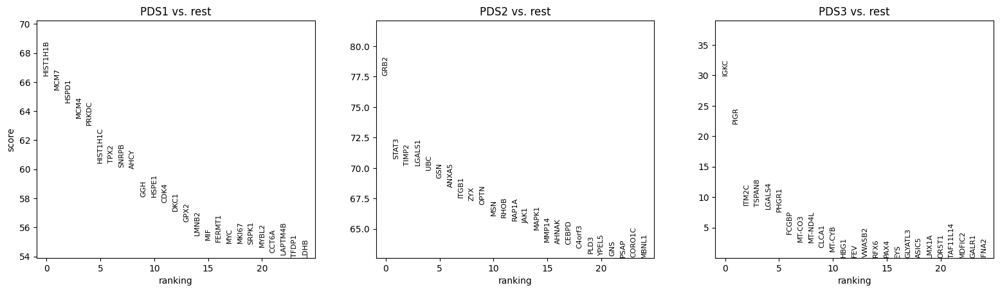

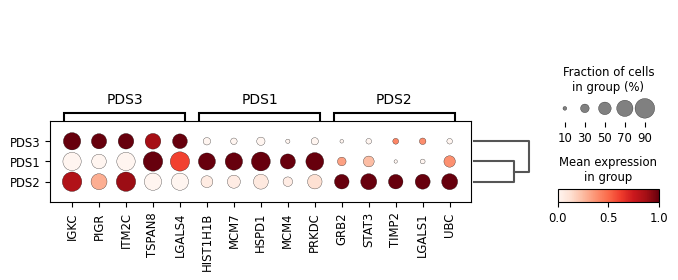

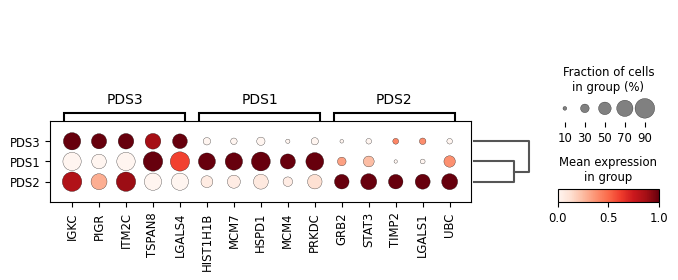

In [113]:
sc.tl.rank_genes_groups(Epithelial_PDS, 'PDS', method="wilcoxon",use_raw =False)
sc.pl.rank_genes_groups(Epithelial_PDS, n_genes=25, sharey=False)
sc.tl.dendrogram(Epithelial_PDS, groupby='PDS')
sc.pl.rank_genes_groups_dotplot(
        Epithelial_PDS, groupby="PDS", standard_scale="var",  n_genes=5, use_raw=False
)
import pandas as pd
import scanpy as sc

# 2. 결과 저장
result = Epithelial_PDS.uns["rank_genes_groups"]
groups = result["names"].dtype.names  # 예: ("Tcells", "Bcells", ...)

# 3. DataFrame 변환
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)

# 4. 결과 저장 딕셔너리
up_dict = {}
down_dict = {}

# 5. 자동 반복 처리
for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)

    # 유전자 이름만 추출
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

# 6. 병합
df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())  # 각 열 이름을 group 이름으로

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

sc.tl.dendrogram(Epithelial_PDS, groupby='PDS')
sc.pl.rank_genes_groups_dotplot(
        Epithelial_PDS, groupby="PDS", standard_scale="var",  n_genes=5, use_raw=False
)

In [119]:
result_df

,PDS1_names,PDS1_pvals_adj,PDS1_logfoldchanges,PDS1_scores,PDS2_names,PDS2_pvals_adj,PDS2_logfoldchanges,PDS2_scores,PDS3_names,PDS3_pvals_adj,PDS3_logfoldchanges,PDS3_scores
0,HIST1H1B,0.000000e+00,2.096869,66.459930,GRB2,0.000000e+00,1.296035,77.602020,IGKC,3.632092e-197,0.630844,29.994776
1,MCM7,0.000000e+00,1.636893,65.492912,STAT3,0.000000e+00,0.889091,70.733635,PIGR,6.522774e-107,0.669737,22.003380
2,HSPD1,0.000000e+00,1.424254,64.595421,TIMP2,0.000000e+00,1.477177,70.223938,ITM2C,5.272345e-18,0.197323,8.707245
3,MCM4,0.000000e+00,2.042058,63.540524,LGALS1,0.000000e+00,1.509645,70.210983,TSPAN8,3.273187e-17,0.145179,8.497211
4,PRKDC,0.000000e+00,1.482588,63.024078,UBC,0.000000e+00,0.880769,69.841347,LGALS4,2.016962e-15,0.237686,8.003435
...,...,...,...,...,...,...,...,...,...,...,...,...
18060,COL6A1,1.230251e-263,-3.192862,-34.793816,PHGR1,1.829429e-55,-0.285633,-15.734967,SNRPB,0.000000e+00,-0.875672,-70.884666
18061,IGKC,2.765728e-264,-1.433572,-34.836910,MT-ND1,5.781362e-58,-0.175098,-16.096048,UBC,0.000000e+00,-0.779916,-71.761169
18062,VIM,3.464293e-270,-2.509933,-35.225937,MT-ND4L,3.371763e-61,-0.119629,-16.551455,CNN3,0.000000e+00,-0.846174,-71.874321
18063,TAGLN,0.000000e+00,-3.522392,-38.247341,MT-CO3,4.586696e-67,-0.174411,-17.347212,GRB2,0.000000e+00,-1.158710,-74.965820


In [60]:
import pandas as pd
import scanpy as sc

# 2. 결과 저장
result = Epithelial_PDS.uns["rank_genes_groups"]
groups = result["names"].dtype.names  # 예: ("Tcells", "Bcells", ...)

# 3. DataFrame 변환
result_df = pd.DataFrame(
    {
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]
    }
)

# 4. 결과 저장 딕셔너리
up_dict = {}
down_dict = {}

# 5. 자동 반복 처리
for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)

    # 유전자 이름만 추출
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

# 6. 병합
df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())  # 각 열 이름을 group 이름으로

df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

In [61]:
from qed.data import readtxt, readseurat, readscanpy
from qed.data import get_enrichment_dataframes
from qed.data import merge_df
from qed.data import query
import inspect

In [62]:
import pandas as pd

# ✅ 사용자 정의 GeneSet 클래스
class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}

# ✅ enrichment에 사용할 데이터베이스 목록
dblist = [
    'KEGG_2021_Human',
    'Reactome_2022',
    'MSigDB_Hallmark_2020',
    'GO_Biological_Process_2023',
    'WikiPathway_2024_Human'
]

# ✅ DEG 테이블 상위 20개 추출 및 저장
df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False, header=True)

# ✅ CSV 불러오기
alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')

# ✅ 각 열마다 GeneSet 객체로 변환
geneset_list = []
for col in alist.columns:
    genes = alist[col].dropna().tolist()
    gs = GeneSet(genes=genes, name=col, annot={"Leiden": col})
    geneset_list.append(gs)

# ✅ enrichment 실행
aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="Leiden",
    n_jobs=None,
    handle_error=True,
    max_iter=1
)

# ✅ 결과 병합 및 후처리
df = merge_df(aalist)
df['Term'] = df['Term'].str.split(r'\(GO:').str[0].str.strip()
df['Term'] = df['Term'].str.split('R-H').str[0].str.strip()
df['Term'] = df['Term'].str.split('WP').str[0].str.strip()


Processing genesets: 5it [00:00,  9.12it/s]                       

Error processing PDS3 for GO_Biological_Process_2023: Error analyzing gene list
Error processing PDS3 for Reactome_2022: Error analyzing gene list
Error processing PDS3 for MSigDB_Hallmark_2020: Error analyzing gene list
Error processing PDS3 for KEGG_2021_Human: Error analyzing gene list
Error processing PDS3 for WikiPathway_2024_Human: Error analyzing gene list


Processing genesets: 10it [00:01,  7.22it/s]

Error processing PDS2 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
Error processing PDS1 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'


Processing genesets: 15it [00:01,  8.57it/s]


Trying to re-request...
Error processing PDS1 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
PDS1 with WikiPathway_2024_Human completed!
Error processing PDS2 for WikiPathway_2024_Human: 'WikiPathway_2024_Human'
PDS2 with WikiPathway_2024_Human completed!
Error processing PDS3 for KEGG_2021_Human: Error analyzing gene list
PDS3 with KEGG_2021_Human completed!
Error processing PDS3 for Reactome_2022: Error analyzing gene list
PDS3 with Reactome_2022 completed!
Error processing PDS3 for MSigDB_Hallmark_2020: Error analyzing gene list
PDS3 with MSigDB_Hallmark_2020 completed!
Error processing PDS3 for GO_Biological_Process_2023: Error analyzing gene list
PDS3 with GO_Biological_Process_2023 completed!
Error processing PDS3 for WikiPathway_2024_Human: Error analyzing gene list
PDS3 with WikiPathway_2024_Human completed!


ValueError: No objects to concatenate

In [ ]:
from typing import List, Tuple, Dict
def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):

    if not isinstance(df, pd.DataFrame):
        raise TypeError("입력 'df'는 pandas DataFrame이어야 합니다.")
    if group_by not in df.columns:
        raise ValueError(f"'{group_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if order_by not in df.columns:
        raise ValueError(f"'{order_by}' 컬럼이 DataFrame에 존재하지 않습니다.")
    if 'Term' not in df.columns:
        raise ValueError("'Term' 컬럼이 DataFrame에 존재하지 않습니다.")

    has_overlapping_genes = 'Overlapping genes' in df.columns

    # P-value 컬럼 숫자형 강제 변환
    df_copy = df.copy()
    df_copy[order_by] = pd.to_numeric(df_copy[order_by], errors='coerce')
    df = df_copy

    df['Term_lower'] = df['Term'].str.lower()

    # 상위 n개 Term 추출
    df_filtered_by_order = df[df[order_by].notna()]
    df_ranked_per_group = (
        df_filtered_by_order
        .sort_values(order_by)
        .groupby(group_by)
        .head(n)
        .reset_index(drop=True)
    )
    if df_ranked_per_group.empty:
        print(f"⚠️ 각 그룹에서 상위 {n}개의 Term을 선택할 수 없습니다.")
        return None, None

    all_selected_terms_lower = df_ranked_per_group['Term_lower'].unique()

    # Overlapping genes 처리
    overlapping_genes_pivot = pd.DataFrame()
    if has_overlapping_genes:
        overlapping_genes_df = df[df['Term_lower'].isin(all_selected_terms_lower)][['Term_lower', group_by, 'Overlapping genes']]
        overlapping_genes_df['Overlapping genes'] = overlapping_genes_df['Overlapping genes'].apply(
            lambda x: ', '.join(map(str, x)) if isinstance(x, list) else str(x)
        )
        overlapping_genes_df = overlapping_genes_df.groupby(['Term_lower', group_by])['Overlapping genes'].apply(', '.join).reset_index()
        overlapping_genes_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
        overlapping_genes_pivot = overlapping_genes_df.pivot(index='Term', columns=group_by, values='Overlapping genes').fillna('')
        overlapping_genes_pivot.index = overlapping_genes_pivot.index.map(lambda x: x.capitalize())

    # P-value pivot table
    aggregated_df = df[df['Term_lower'].isin(all_selected_terms_lower)].groupby(['Term_lower', group_by], as_index=False)[order_by].min()
    aggregated_df.rename(columns={'Term_lower': 'Term'}, inplace=True)
    pivot_df = aggregated_df.pivot(index="Term", columns=group_by, values=order_by).fillna(1).rename_axis(None, axis=1)

    # Log 변환
    is_pvalue_column = order_by.lower() in ['adjusted p-value', 'p-value']
    pivot_df_for_heatmap = -np.log10(np.maximum(pivot_df, np.finfo(float).eps)) if is_pvalue_column else pivot_df.copy()
    pivot_df_for_heatmap.index = pivot_df_for_heatmap.index.map(lambda x: x.capitalize())

    # ✅ Overlapping genes와 결합
    final_pivot_df = pd.concat([pivot_df_for_heatmap, overlapping_genes_pivot], axis=1)

    if save_to_file:
        try:
            final_pivot_df.to_csv(save_to_file, encoding='utf-8-sig')
            print(f"✅ 히트맵 데이터 저장 완료: '{save_to_file}'")
        except Exception as e:
            print(f"❌ 저장 실패: {e}")

    # ✅ column_order 기준 row 정렬
    row_order = []
    seen_terms = set()

    if enable_column_order and column_order:
        group_order_for_plot = [group for group in column_order if group in df[group_by].unique()]
    else:
        group_order_for_plot = df[group_by].unique()

    for group in group_order_for_plot:
        current_group_terms = df_ranked_per_group[df_ranked_per_group[group_by] == group].sort_values(order_by)
        for term_lower_val in current_group_terms['Term_lower']:
            capitalized_term = term_lower_val.capitalize()
            if capitalized_term in pivot_df_for_heatmap.index and capitalized_term not in seen_terms:
                row_order.append(capitalized_term)
                seen_terms.add(capitalized_term)

    clustered_data = final_pivot_df.loc[row_order]
    heatmap_data = clustered_data.select_dtypes(include=[np.number])
   # 1️⃣ 사용자 지정 column_order가 있으면 그 순서 적용
    if enable_column_order and column_order:
        valid_cols = [c for c in column_order if c in heatmap_data.columns]
        if valid_cols:
            heatmap_data = heatmap_data[valid_cols]

# 2️⃣ column_order가 없고, 열 이름이 전부 숫자로 해석 가능하면 오름차순 정렬
    else:
        try:
        # 모든 열 이름을 float으로 바꿔 보고 성공하면 오름차순 재정렬
            numeric_col_keys = [float(c) for c in heatmap_data.columns]
            sorted_cols = [col for _, col in sorted(zip(numeric_col_keys, heatmap_data.columns))]
            heatmap_data = heatmap_data[sorted_cols]
        except ValueError:
        # 열 이름이 숫자가 아닌 게 섞여 있으면 그대로 둡니다
            pass


    if is_pvalue_column:
        p_values_for_annotation = 10 ** (-np.clip(heatmap_data, None, 300))
        annotations = np.where(p_values_for_annotation <= 0.05, '*', '')
        annotations = annotations.astype(object)
    else:
        annotations = False

    # ✅ 열 강조 인덱스 계산 (선 추가)
    highlight_column_indices = []
    if enable_highlight_columns and highlight_column_names:
        highlight_column_indices = [
            list(heatmap_data.columns).index(col)
            for col in highlight_column_names if col in heatmap_data.columns
        ]

    # ✅ 시각화
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax,
                linewidths=linewidths, annot=annotations, fmt='',
                linecolor='white', ax=ax, cbar_kws=cbar_kws, square=True,
                annot_kws={"size": 12, "color": "white", "weight": "bold"})

    # 수직선 추가
    for x in highlight_column_indices:
        ax.vlines(x + 1, *ax.get_ylim(), colors='black', linewidth=2)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)
    if title:
        ax.set_title(title, fontsize=18, pad=20)
    plt.grid(False)

    if 'Term_lower' in df.columns:
        df.drop(columns='Term_lower', inplace=True)

    return fig, ax

In [ ]:
fig, ax = heatmap_with_groupwise_ordering(
    df= df,
    n=5,
    group_by='Leiden',
    order_by="Adjusted p-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=13,
    ylabel_fontsize=13,
    figsize=(3, 14),
    vmin=0, vmax=6,
    cbar_kws={'shrink': 0.5, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

# SMI score

In [15]:
import pandas as pd

# 파일 경로
file_path = "/home/Data_Drive_8TB/kykim/2. CRC/CRC2/PDSclassifier/Epithelial_sc_SMI.parquet"

# parquet 파일 읽기
smi = pd.read_parquet(file_path,engine="fastparquet")

In [16]:
df_indexed = smi.set_index("Barcode")
Epithelial.obs["SMI"] = Epithelial.obs.index.map(df_indexed["SMI"])

/tmp/ipykernel_2894508/4238232346.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df, x='PDS', y='SMI', palette='Set2', showfliers=False)


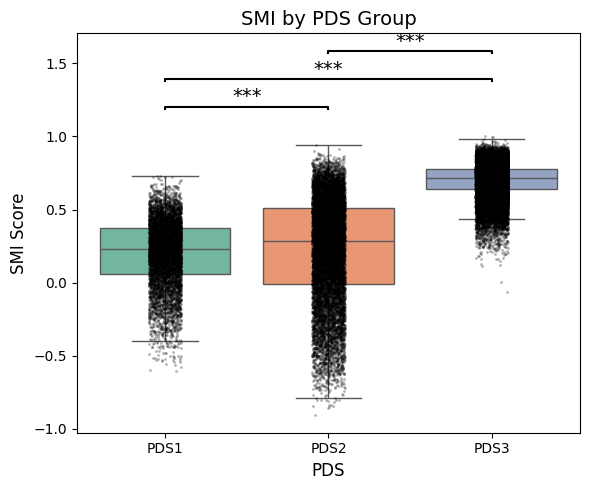

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import pandas as pd

# 1. Mixed 제외 & PDS 순서 고정
df = Epithelial.obs[Epithelial.obs["PDS"].isin(["PDS1", "PDS2", "PDS3"])].copy()
df["PDS"] = pd.Categorical(df["PDS"], categories=["PDS1", "PDS2", "PDS3"], ordered=True)

# 2. T-test 계산
def get_pval_stars(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return "n.s."

comparisons = [
    ("PDS1", "PDS2"),
    ("PDS1", "PDS3"),
    ("PDS2", "PDS3")
]

pval_results = []
for g1, g2 in comparisons:
    g1_data = df[df["PDS"] == g1]["SMI"]
    g2_data = df[df["PDS"] == g2]["SMI"]
    stat, pval = ttest_ind(g1_data, g2_data, equal_var=False)
    pval_results.append((g1, g2, pval))

# 3. Plot
plt.figure(figsize=(6, 5))
ax = sns.boxplot(data=df, x='PDS', y='SMI', palette='Set2', showfliers=False)
sns.stripplot(data=df, x='PDS', y='SMI', color='k', size=2, alpha=0.3, jitter=True)

# 4. P-value 별표 표시
y_max = df["SMI"].max()
y_offset = (df["SMI"].max() - df["SMI"].min()) * 0.1
for i, (g1, g2, pval) in enumerate(pval_results):
    x1 = df["PDS"].cat.categories.get_loc(g1)
    x2 = df["PDS"].cat.categories.get_loc(g2)
    y = y_max + y_offset * (i + 1)
    
    # 수평선
    ax.plot([x1, x1, x2, x2], [y, y + 0.01, y + 0.01, y], lw=1.5, c='k')
    
    # 별표 텍스트
    ax.text((x1 + x2) / 2, y + 0.015, get_pval_stars(pval), ha='center', va='bottom', fontsize=14)

# 라벨
plt.title("SMI by PDS Group", fontsize=14)
plt.xlabel("PDS", fontsize=12)
plt.ylabel("SMI Score", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


/tmp/ipykernel_3310770/2628160636.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df, x='PDS', y='SMI', palette='Set2', showfliers=False)
/tmp/ipykernel_3310770/2628160636.py:55: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = df.groupby("PDS")["SMI"].mean()


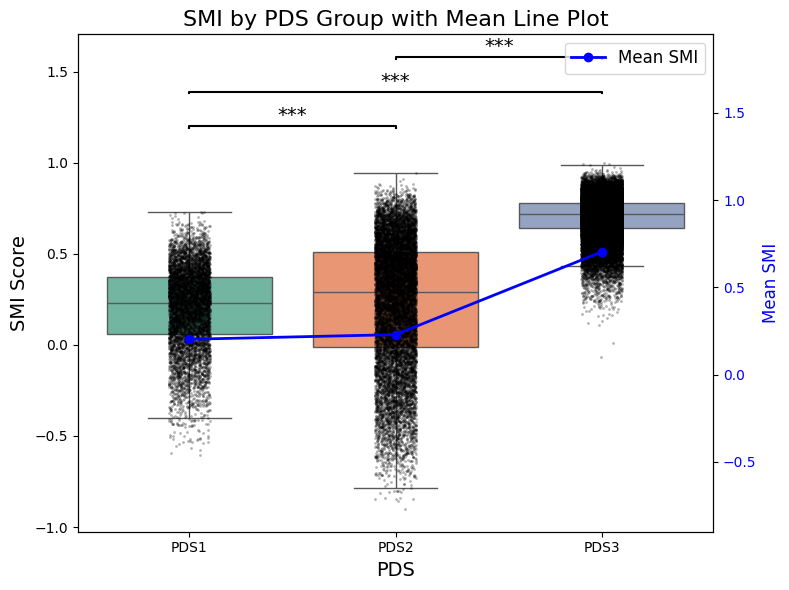

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import pandas as pd

# 1. Mixed 제외 & PDS 순서 고정
df = Epithelial.obs[Epithelial.obs["PDS"].isin(["PDS1", "PDS2", "PDS3"])].copy()
df["PDS"] = pd.Categorical(df["PDS"], categories=["PDS1", "PDS2", "PDS3"], ordered=True)

# 2. T-test 계산
def get_pval_stars(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return "n.s."

comparisons = [
    ("PDS1", "PDS2"),
    ("PDS1", "PDS3"),
    ("PDS2", "PDS3")
]

pval_results = []
for g1, g2 in comparisons:
    g1_data = df[df["PDS"] == g1]["SMI"]
    g2_data = df[df["PDS"] == g2]["SMI"]
    stat, pval = ttest_ind(g1_data, g2_data, equal_var=False)
    pval_results.append((g1, g2, pval))

# 3. Plot (boxplot + stripplot)
plt.figure(figsize=(8, 6))
ax = sns.boxplot(data=df, x='PDS', y='SMI', palette='Set2', showfliers=False)
sns.stripplot(data=df, x='PDS', y='SMI', color='k', size=2, alpha=0.3, jitter=True)

# 4. P-value 별표 표시
y_max = df["SMI"].max()
y_min = df["SMI"].min()
y_offset = (y_max - y_min) * 0.1
for i, (g1, g2, pval) in enumerate(pval_results):
    x1 = df["PDS"].cat.categories.get_loc(g1)
    x2 = df["PDS"].cat.categories.get_loc(g2)
    y = y_max + y_offset * (i + 1)
    
    # 수평선
    ax.plot([x1, x1, x2, x2], [y, y + 0.01, y + 0.01, y], lw=1.5, c='k')
    
    # 별표 텍스트
    ax.text((x1 + x2) / 2, y + 0.015, get_pval_stars(pval), ha='center', va='bottom', fontsize=14)

# 5. PDS별 SMI 평균값 계산 후 꺾은선그래프 추가
means = df.groupby("PDS")["SMI"].mean()
# x좌표: PDS 카테고리 인덱스
x_coords = [df["PDS"].cat.categories.get_loc(p) for p in means.index]

# 꺾은선 그래프 (평균값)
ax2 = ax.twinx()  # y축 공유하되 별도 y축 생성
ax2.plot(x_coords, means.values, color='blue', marker='o', linestyle='-', linewidth=2, label='Mean SMI')
ax2.set_ylabel("Mean SMI", color='blue', fontsize=12)
ax2.tick_params(axis='y', labelcolor='blue')
ax2.set_ylim(y_min, y_max + y_offset * (len(pval_results) + 2))  # 박스플롯 y범위와 비슷하게 조정

# x축 라벨은 기존 그대로 유지
ax2.set_xticks(x_coords)
ax2.set_xticklabels(means.index, fontsize=10)

# 범례
ax2.legend(loc='upper right', fontsize=12)

# 6. 라벨, 타이틀 설정
ax.set_title("SMI by PDS Group with Mean Line Plot", fontsize=16)
ax.set_xlabel("PDS", fontsize=14)
ax.set_ylabel("SMI Score", fontsize=14)

plt.tight_layout()
plt.show()


/tmp/ipykernel_2894508/239832844.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df, x='PDS', y='SMI', palette='Set2', showfliers=False)
/tmp/ipykernel_2894508/239832844.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = df.groupby("PDS")["SMI"].mean()


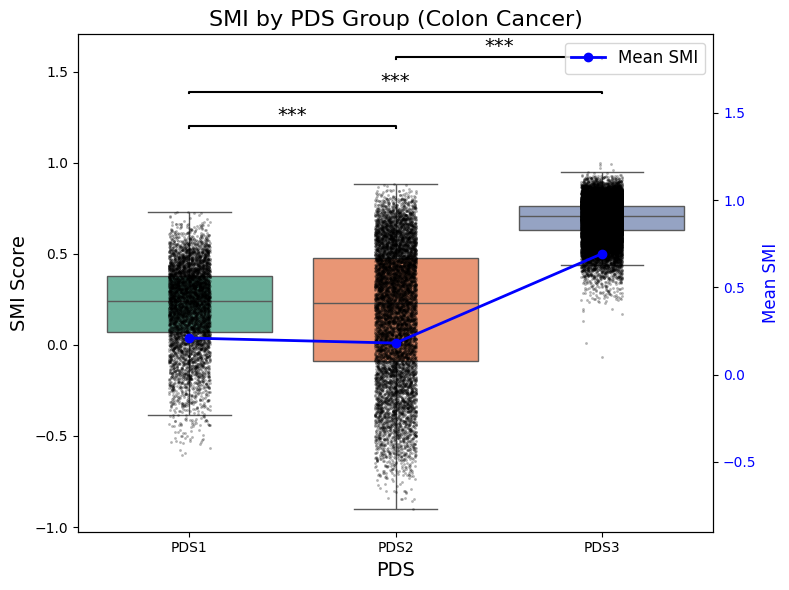

/tmp/ipykernel_2894508/239832844.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=df, x='PDS', y='SMI', palette='Set2', showfliers=False)
/tmp/ipykernel_2894508/239832844.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = df.groupby("PDS")["SMI"].mean()


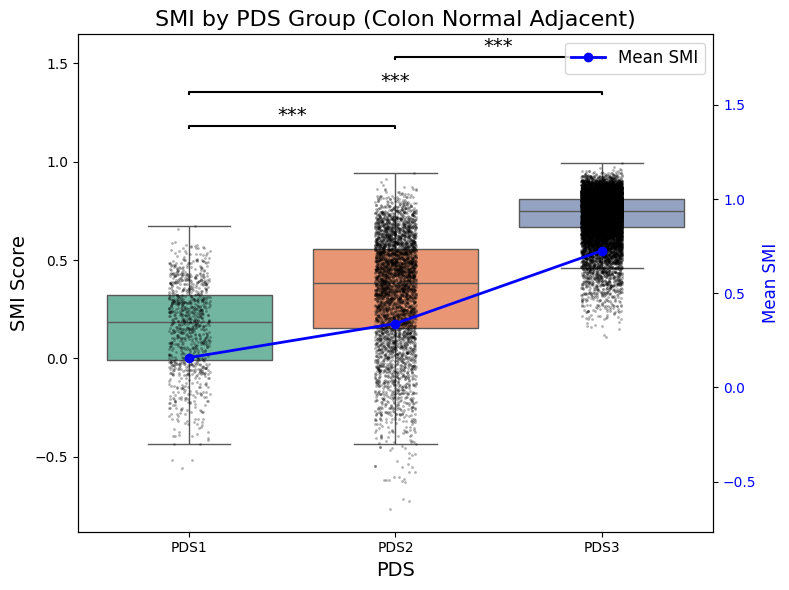

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import pandas as pd

# PDS 순서 고정
pds_order = ["PDS1", "PDS2", "PDS3"]

# P-value를 별표로 변환하는 함수
def get_pval_stars(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return "n.s."

# 비교쌍 정의
comparisons = [("PDS1", "PDS2"), ("PDS1", "PDS3"), ("PDS2", "PDS3")]

# TissueType 별 반복
for tissue in Epithelial.obs["TissueType"].unique():
    # 1. 해당 tissuetype만 필터링
    df = Epithelial.obs[
        (Epithelial.obs["PDS"].isin(pds_order)) & 
        (Epithelial.obs["TissueType"] == tissue)
    ].copy()
    df["PDS"] = pd.Categorical(df["PDS"], categories=pds_order, ordered=True)

    # 2. T-test 계산
    pval_results = []
    for g1, g2 in comparisons:
        g1_data = df[df["PDS"] == g1]["SMI"]
        g2_data = df[df["PDS"] == g2]["SMI"]
        stat, pval = ttest_ind(g1_data, g2_data, equal_var=False)
        pval_results.append((g1, g2, pval))

    # 3. Plot (boxplot + stripplot)
    plt.figure(figsize=(8, 6))
    ax = sns.boxplot(data=df, x='PDS', y='SMI', palette='Set2', showfliers=False)
    sns.stripplot(data=df, x='PDS', y='SMI', color='k', size=2, alpha=0.3, jitter=True)

    # 4. P-value 별표 표시
    y_max = df["SMI"].max()
    y_min = df["SMI"].min()
    y_offset = (y_max - y_min) * 0.1
    for i, (g1, g2, pval) in enumerate(pval_results):
        x1 = df["PDS"].cat.categories.get_loc(g1)
        x2 = df["PDS"].cat.categories.get_loc(g2)
        y = y_max + y_offset * (i + 1)

        ax.plot([x1, x1, x2, x2], [y, y + 0.01, y + 0.01, y], lw=1.5, c='k')
        ax.text((x1 + x2) / 2, y + 0.015, get_pval_stars(pval), ha='center', va='bottom', fontsize=14)

    # 5. 평균 꺾은선그래프
    means = df.groupby("PDS")["SMI"].mean()
    x_coords = [df["PDS"].cat.categories.get_loc(p) for p in means.index]
    ax2 = ax.twinx()
    ax2.plot(x_coords, means.values, color='blue', marker='o', linestyle='-', linewidth=2, label='Mean SMI')
    ax2.set_ylabel("Mean SMI", color='blue', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='blue')
    ax2.set_ylim(y_min, y_max + y_offset * (len(pval_results) + 2))
    ax2.set_xticks(x_coords)
    ax2.set_xticklabels(means.index, fontsize=10)
    ax2.legend(loc='upper right', fontsize=12)

    # 6. 제목, 레이블
    ax.set_title(f"SMI by PDS Group ({tissue})", fontsize=16)
    ax.set_xlabel("PDS", fontsize=14)
    ax.set_ylabel("SMI Score", fontsize=14)

    plt.tight_layout()
    plt.show()


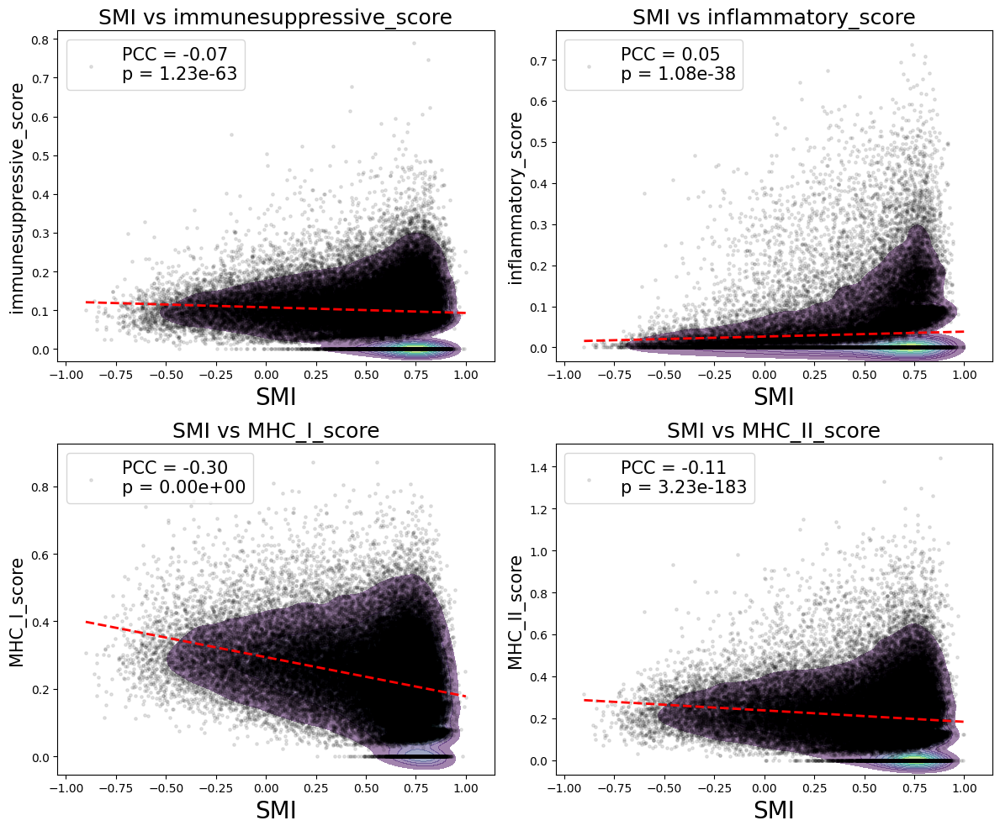

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

filtered_obs = Epithelial.obs[Epithelial.obs["PDS"] != "Mixed"].copy()

x_col = 'SMI'
score_cols = ['immunesuppressive_score', 'inflammatory_score', 'MHC_I_score', 'MHC_II_score']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for ax, y_col in zip(axes, score_cols):
    x = filtered_obs[x_col].values
    y = filtered_obs[y_col].values

    valid = ~np.isnan(x) & ~np.isnan(y)
    x_valid = x[valid]
    y_valid = y[valid]

    # 2D 밀도 커널 플롯 (contourf)
    sns.kdeplot(x=x_valid, y=y_valid, fill=True, cmap='viridis', alpha=0.5, ax=ax)

    # 산점도 (점 작게, 반투명)
    ax.scatter(x_valid, y_valid, s=6, color='k', alpha=0.1)

    # 회귀선 및 상관계수
    if len(x_valid) > 2 and np.std(x_valid) > 0 and np.std(y_valid) > 0:
        corr, pval = pearsonr(x_valid, y_valid)
        slope, intercept = np.polyfit(x_valid, y_valid, 1)
        x_fit = np.linspace(min(x_valid), max(x_valid), 100)
        y_fit = slope * x_fit + intercept
        ax.plot(x_fit, y_fit, 'r--', linewidth=2)
        legend_text = f"PCC = {corr:.2f}\np = {pval:.2e}"
    else:
        legend_text = "Not enough data"

    ax.legend([legend_text], fontsize=15)
    ax.set_title(f"{x_col} vs {y_col}", fontsize=18)
    ax.set_xlabel(x_col, fontsize=20)
    ax.set_ylabel(y_col, fontsize=15)
    ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()


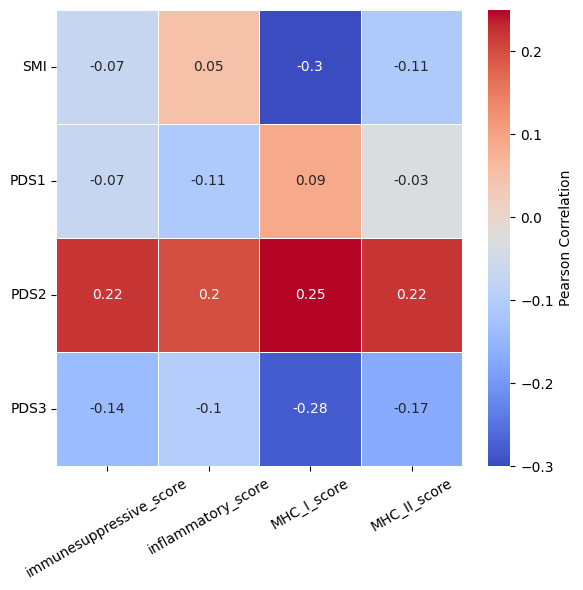

In [111]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 🔹 1. Mixed 제외
df = Epithelial.obs[Epithelial.obs["PDS"] != "Mixed"].copy()

# 🔹 2. Score columns
score_cols = ['immunesuppressive_score', 'inflammatory_score', 'MHC_I_score', 'MHC_II_score']

# 🔹 3. PDS별 indicator 열 추가
df["PDS1"] = (df["PDS"] == "PDS1").astype(int)
df["PDS2"] = (df["PDS"] == "PDS2").astype(int)
df["PDS3"] = (df["PDS"] == "PDS3").astype(int)

# 🔹 4. 대상 Y 변수와 X 변수
y_cols = ['SMI', 'PDS1', 'PDS2', 'PDS3']
x_cols = score_cols

# 🔹 5. 상관계수 계산
corr_matrix = pd.DataFrame(index=y_cols, columns=x_cols)

for y in y_cols:
    for x in x_cols:
        valid = df[[y, x]].dropna()
        corr = valid[y].corr(valid[x])
        corr_matrix.loc[y, x] = round(corr, 2)

corr_matrix = corr_matrix.astype(float)

# 🔹 6. 동적 색상 범위 설정
vmin = corr_matrix.min().min()
vmax = corr_matrix.max().max()

# 🔹 7. 히트맵 시각화
plt.figure(figsize=(6, 6))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    vmin=vmin,
    vmax=vmax,
    linewidths=0.5,
    cbar_kws={'label': 'Pearson Correlation'}
)

plt.xticks(rotation=30, fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
##### PDS PCA

In [122]:
import pandas as pd
PCA = pd.read_csv("/home/Data_Drive_8TB/kykim/2. CRC/CRC2/PDSclassifier/PDS_singlecell_pathway.csv", index_col=0)

In [125]:
PCA = PCA.T

In [138]:
PCA

,BIOCARTA_ACE2_PATHWAY,BIOCARTA_ACTINY_PATHWAY,BIOCARTA_AGR_PATHWAY,BIOCARTA_AHSP_PATHWAY,BIOCARTA_AKAP95_PATHWAY,BIOCARTA_AKAPCENTROSOME_PATHWAY,BIOCARTA_ALK_PATHWAY,BIOCARTA_AMAN_PATHWAY,BIOCARTA_ASBCELL_PATHWAY,BIOCARTA_ATRBRCA_PATHWAY,...,REACTOME_UNWINDING_OF_DNA,REACTOME_UREA_CYCLE,REACTOME_VEGFR2_MEDIATED_VASCULAR_PERMEABILITY,REACTOME_VLDLR_INTERNALISATION_AND_DEGRADATION,REACTOME_VOLTAGE_GATED_POTASSIUM_CHANNELS,REACTOME_WNT5A_DEPENDENT_INTERNALIZATION_OF_FZD2_FZD5_AND_ROR2,REACTOME_WNT5A_DEPENDENT_INTERNALIZATION_OF_FZD4,REACTOME_XENOBIOTICS,REACTOME_YAP1_AND_WWTR1_TAZ_STIMULATED_GENE_EXPRESSION,REACTOME_ZINC_INFLUX_INTO_CELLS_BY_THE_SLC39_GENE_FAMILY
01_AAACAAGCAAGGCCTGACTTTAGG-1,-0.030192,0.243821,0.264806,0.168698,0.308187,0.246968,0.144063,0.094378,0.042583,0.179326,...,0.136328,0.153786,0.364017,0.355266,-0.032513,0.390365,0.430156,0.108782,0.265433,0.276853
01_AAACCAATCAACTGTTACTTTAGG-1,0.000240,0.268159,0.288194,0.196728,0.385749,0.254329,0.108538,0.101475,-0.049074,0.232045,...,0.152995,0.131733,0.403625,0.341877,-0.104115,0.364561,0.402283,0.044640,0.278051,0.303817
01_AAACCAATCAGGCATGACTTTAGG-1,-0.033996,0.263483,0.275099,0.209680,0.290546,0.243602,0.176845,0.107436,0.033056,0.170229,...,0.150294,0.131935,0.386864,0.358035,-0.040191,0.355661,0.392469,0.069435,0.261966,0.271289
01_AAACCAATCATCACATACTTTAGG-1,0.017449,0.235605,0.272771,0.172978,0.264528,0.241827,0.128721,0.095417,0.053241,0.188616,...,0.176849,0.101004,0.377464,0.332732,-0.024137,0.345921,0.384875,0.075313,0.247283,0.318225
01_AAACCAATCGAGGCACACTTTAGG-1,-0.029788,0.215085,0.279143,0.195230,0.259104,0.271558,0.134269,0.085600,0.043977,0.180318,...,0.162316,0.097034,0.394306,0.326805,-0.031369,0.343201,0.383374,0.118522,0.268337,0.281609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32_TTTGGACGTGGTTCGCAGTAGGCT-1,-0.032330,0.212245,0.270605,0.166628,0.255078,0.245134,0.112285,0.117672,0.037108,0.195255,...,0.134301,0.094324,0.364715,0.322454,-0.036706,0.341170,0.382353,0.063698,0.258051,0.297727
32_TTTGTGAGTAAAGCGCAGTAGGCT-1,0.045238,0.226217,0.270485,0.181720,0.265781,0.256616,0.112950,0.056199,0.037830,0.303909,...,0.290754,0.094457,0.358755,0.322475,-0.036428,0.352603,0.390240,0.073288,0.257263,0.284569
32_TTTGTGAGTGACCTATAGTAGGCT-1,-0.044051,0.224028,0.306262,0.170566,0.275559,0.242709,0.154609,0.148686,0.124292,0.281171,...,0.217362,0.181243,0.368592,0.349543,-0.059694,0.387126,0.409732,0.080152,0.254765,0.339704
32_TTTGTGAGTGATTAGGAGTAGGCT-1,-0.032557,0.216482,0.266537,0.166453,0.315046,0.274124,0.111946,0.127273,0.036868,0.270332,...,0.159622,0.133795,0.381146,0.322376,-0.033055,0.348779,0.382192,0.063405,0.256740,0.294112


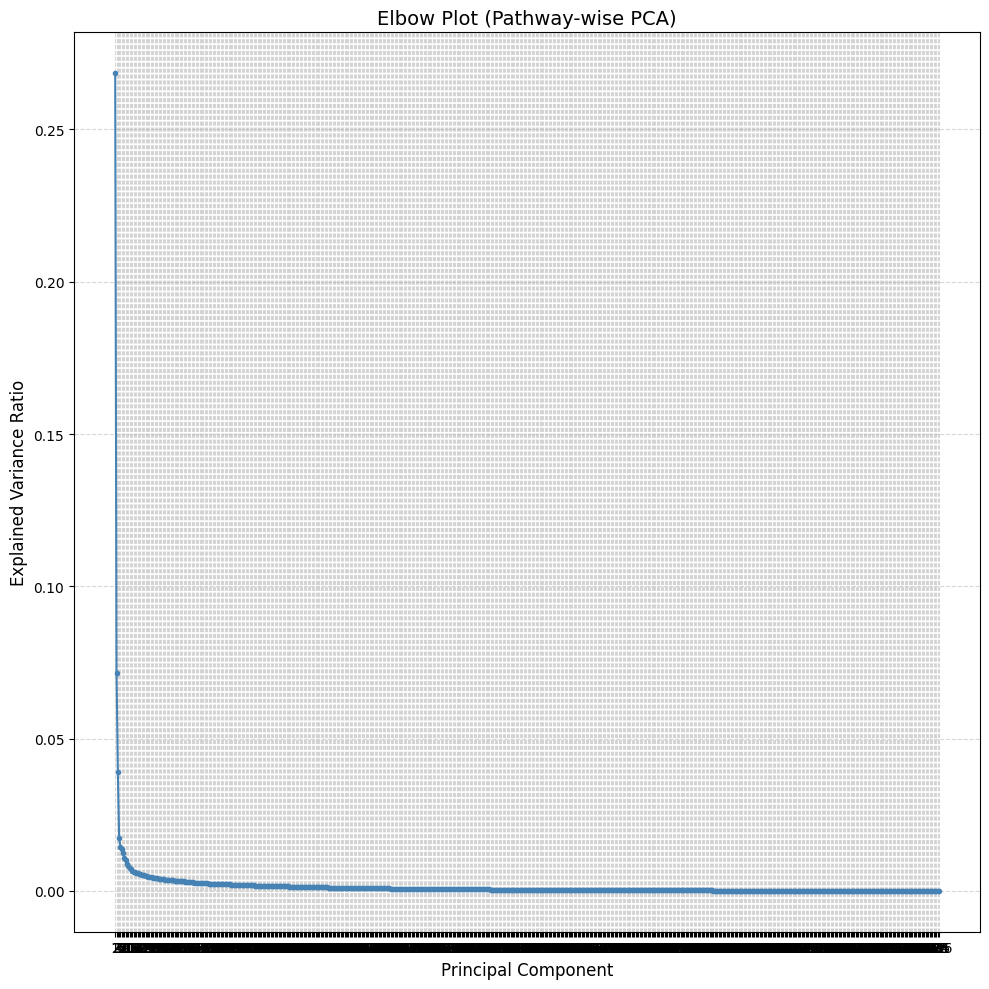

In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA as SKPCA

# 🔹 PCA 실행 (pathway × cell 데이터)
pca_model = SKPCA()
pca_result = pca_model.fit(PCA.values)

# 🔹 분산 설명 비율 추출
explained_var = pca_model.explained_variance_ratio_

# 🔹 Elbow plot
plt.figure(figsize=(100, 10))
plt.plot(range(1, len(explained_var) + 1), explained_var, marker='o', linestyle='-', color='steelblue',markersize=3)
plt.title('Elbow Plot (Pathway-wise PCA)', fontsize=14)
plt.xlabel('Principal Component', fontsize=12)
plt.ylabel('Explained Variance Ratio', fontsize=12)
plt.xticks(np.arange(1, len(explained_var) + 1))
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


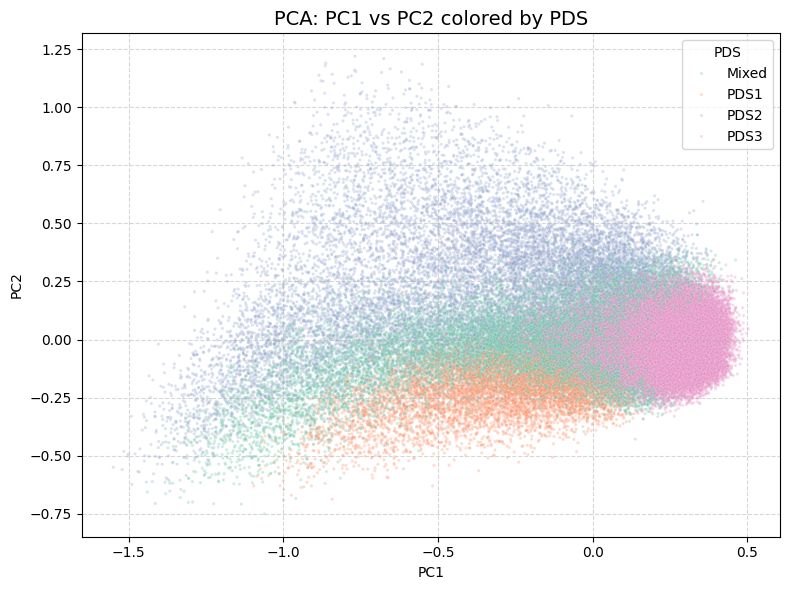

In [143]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA as SKPCA

# 1. PCA 15개 주성분으로 재실행
pca_model = SKPCA(n_components=15)
pca_result = pca_model.fit_transform(PCA.values)  # PCA.values는 pathway×cell 데이터

# 2. 주성분 결과를 DataFrame으로 변환
pca_df = pd.DataFrame(pca_result, columns=[f'PC{i+1}' for i in range(15)])

# 3. PDS 정보 (분류 변수) 추가 — Epithelial.obs 기준으로 맞춰야 함
# 예: Epithelial.obs가 pathway 순서와 맞는지 확인 필요
# 여기서는 예시로 Epithelial.obs['PDS']가 순서에 맞게 정렬됐다고 가정
pca_df['PDS'] = Epithelial.obs.loc[PCA.index, 'PDS'].values

# 4. PC1 vs PC2 scatter plot
plt.figure(figsize=(8,6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='PDS', palette='Set2', s=5, alpha=0.3)
plt.title('PCA: PC1 vs PC2 colored by PDS', fontsize=14)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='PDS')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


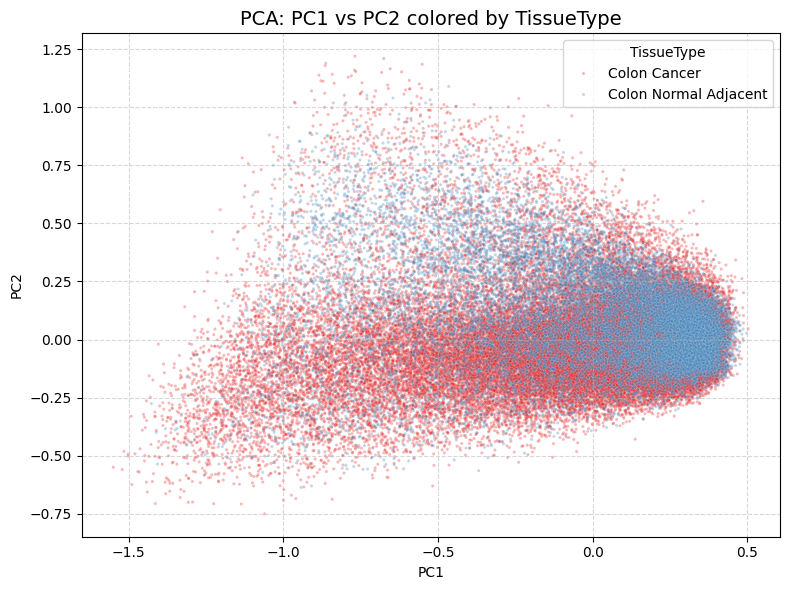

In [148]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue=Epithelial.obs.loc[PCA.index, 'TissueType'].values,  # TissueType으로 색상 구분
    palette='Set1',  # tissue type에 어울리는 팔레트로 변경 가능
    s=5,
    alpha=0.3
)
plt.title('PCA: PC1 vs PC2 colored by TissueType', fontsize=14)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='TissueType')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


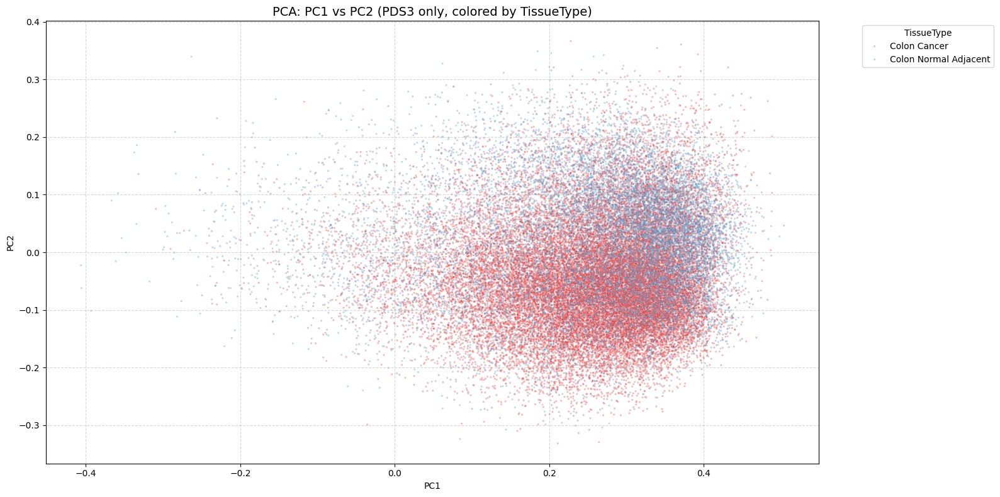

In [181]:
import matplotlib.pyplot as plt
import seaborn as sns

# 🔹 1. PCA 결과에 TissueType, PDS 정보 붙이기
pca_df["TissueType"] = Epithelial.obs.loc[PCA.index, "TissueType"].values
pca_df["PDS"] = Epithelial.obs.loc[PCA.index, "PDS"].values

# 🔹 2. PDS3인 셀만 필터링
pds3_df = pca_df[pca_df["PDS"] == "PDS3"].copy()

# 🔹 3. Plot
plt.figure(figsize=(16, 8))
sns.scatterplot(
    data=pds3_df,
    x='PC1',
    y='PC2',
    hue='TissueType',         # TissueType에 따라 색상
    palette='Set1',
    s=5,
    alpha=0.3
)
plt.title('PCA: PC1 vs PC2 (PDS3 only, colored by TissueType)', fontsize=14)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='TissueType', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [183]:
import numpy as np
import pandas as pd
from itertools import combinations
from sklearn.preprocessing import MinMaxScaler

# 1. PDS3의 PCA 데이터
pds3_df = pca_df[pca_df["PDS"] == "PDS3"].copy()

# 2. PCA 좌표 정규화 (0~1 사이로)
scaler = MinMaxScaler()
pds3_df[["PC1_norm", "PC2_norm"]] = scaler.fit_transform(pds3_df[["PC1", "PC2"]])

# 3. 격자 bin 설정
n_bins = 50
pds3_df["x_bin"] = (pds3_df["PC1_norm"] * n_bins).astype(int)
pds3_df["y_bin"] = (pds3_df["PC2_norm"] * n_bins).astype(int)

# 4. 각 TissueType별 (x_bin, y_bin) 집합 생성
bin_sets = {
    tissue: set(
        zip(group["x_bin"], group["y_bin"])
    )
    for tissue, group in pds3_df.groupby("TissueType")
}

# 5. 자카드 계수 계산
jac_results = []
for t1, t2 in combinations(bin_sets.keys(), 2):
    set1, set2 = bin_sets[t1], bin_sets[t2]
    intersection = len(set1 & set2)
    union = len(set1 | set2)
    jaccard = intersection / union if union > 0 else 0
    jac_results.append((t1, t2, jaccard))

# 6. 결과 출력
jac_df = pd.DataFrame(jac_results, columns=["TissueType1", "TissueType2", "JaccardIndex"])
jac_df = jac_df.sort_values("JaccardIndex", ascending=False)
print(jac_df)


    TissueType1            TissueType2  JaccardIndex
0  Colon Cancer  Colon Normal Adjacent      0.730337


/tmp/ipykernel_3310770/4220652617.py:23: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



/home/Data_Drive_8TB/kykim/.conda/envs/kykim/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


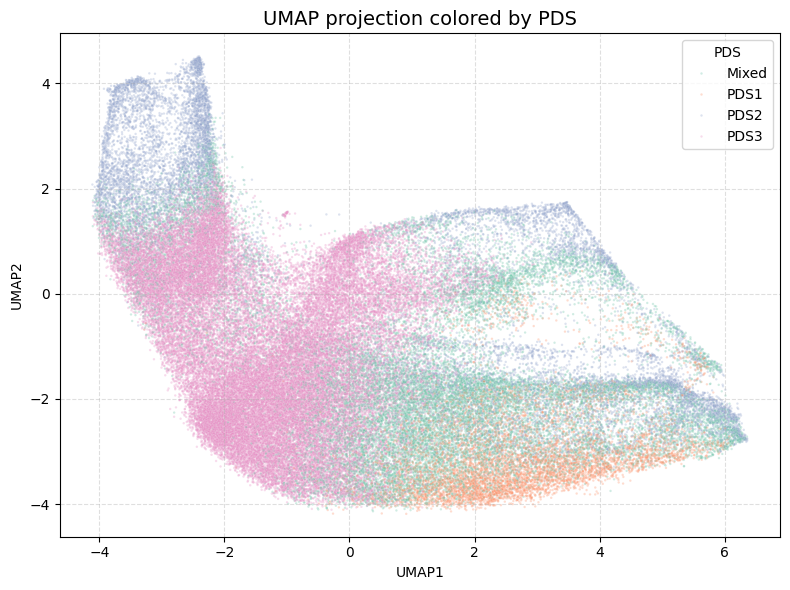

In [145]:
import umap
import matplotlib.pyplot as plt
import seaborn as sns

# UMAP 임베딩 (pathway x cell 행렬에 대해)
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='euclidean', random_state=42)
embedding = reducer.fit_transform(PCA.values)  # PCA.values = pathway x cell matrix

# embedding을 데이터프레임으로 변환
embedding_df = pd.DataFrame(embedding, columns=['UMAP1', 'UMAP2'])
embedding_df['PDS'] = Epithelial.obs.loc[PCA.index, 'PDS'].values  # index 맞는지 확인 필요

# 시각화
plt.figure(figsize=(8,6))
sns.scatterplot(data=embedding_df, x='UMAP1', y='UMAP2', hue='PDS', palette='Set2', s=3, alpha=0.3)
plt.title('UMAP projection colored by PDS', fontsize=14)
plt.legend(title='PDS')
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


In [177]:
embedding_df

,UMAP1,UMAP2,TissueType
0,-0.554616,-2.841494,Colon Cancer
1,4.464164,-2.933571,Colon Cancer
2,0.815287,-2.210656,Colon Cancer
3,-0.883389,-2.860074,Colon Cancer
4,-0.771207,-1.452117,Colon Cancer
...,...,...,...
86939,-0.080977,-0.174220,Colon Normal Adjacent
86940,0.905071,-3.916133,Colon Normal Adjacent
86941,1.391449,-0.803572,Colon Normal Adjacent
86942,0.860770,-3.885746,Colon Normal Adjacent


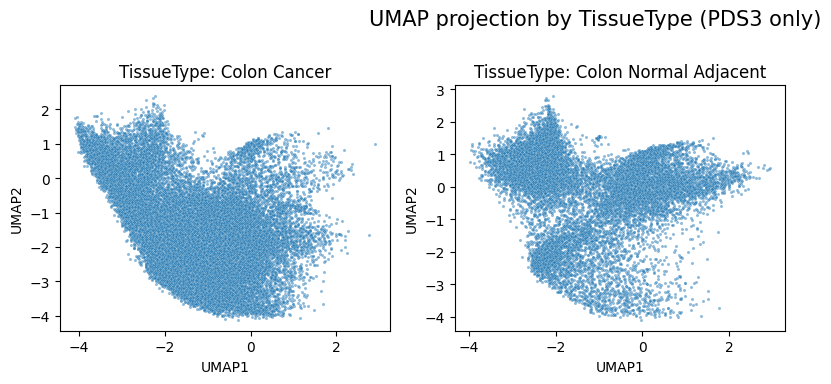

In [178]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 🔹 0. PDS 정보 재지정 (확실하게)
embedding_df["PDS"] = Epithelial.obs.loc[PCA.index, "PDS"].values
embedding_df["TissueType"] = Epithelial.obs.loc[PCA.index, "TissueType"].values

# 🔹 1. PDS3만 필터링
pds3_df = embedding_df[embedding_df["PDS"] == "PDS3"].copy()

# 🔹 2. 고유 TissueType 리스트
unique_tissues = pds3_df["TissueType"].unique()

# 🔹 3. subplot 구성
n_cols = 3
n_rows = (len(unique_tissues) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

# 🔹 4. 각 TissueType에 대해 UMAP 시각화
for i, tissue in enumerate(unique_tissues):
    ax = axes[i]
    subset = pds3_df[pds3_df["TissueType"] == tissue]
    
    sns.scatterplot(
        data=subset, x="UMAP1", y="UMAP2",
        s=5, alpha=0.5, ax=ax
    )
    ax.set_title(f"TissueType: {tissue}", fontsize=12)
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")

# 🔹 5. 남은 subplot 제거
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("UMAP projection by TissueType (PDS3 only)", fontsize=15)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()
